# MS002 Preprocess
01/25/2024

In [2]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy


import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import sys
sys.path.append('/Users/alexandrafink/Documents/GitHub/LFPAnalysis/')

In [5]:
from LFPAnalysis import lfp_preprocess_utils, sync_utils, analysis_utils, nlx_utils

In [6]:
# Specify root directory for un-archived data and results 
base_dir = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/SWB/'
anat_dir = f'{base_dir}anat_recons/recon_labels/'
neural_dir = f'{base_dir}ephys_analysis/data/'
behav_dir = f'{base_dir}behavior_analysis/behavior_preprocessed/'

subj_id = 'MS002'
subj_format = ['edf']
subj_site = ['MSSM']

# Make mne_data


### Load and resample data


In [7]:
edf_files = glob(f'{neural_dir}{subj_id}/raw/*.edf')

mne_data = mne.io.read_raw_edf(edf_files[0], preload=True)


Extracting EDF parameters from /Users/alexandrafink/Documents/GraduateSchool/SaezLab/SWB/ephys_analysis/data/MS002/raw/MS002_SWB.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


Reading 0 ... 2219007  =      0.000 ...  2166.999 secs...


In [8]:
mne_data

<RawEDF | MS002_SWB.edf, 276 x 2219008 (2167.0 s), ~4.56 GB, data loaded>

In [98]:
list(mne_data.ch_names)

['LlOiF1',
 'LlOiF2',
 'LlOiF3',
 'LlOiF4',
 'LlOiF5',
 'LlOiF6',
 'LlOiF7',
 'LlOiF8',
 'LlOiF9',
 'LlOiF10',
 'LmOlF1',
 'LmOlF2',
 'LmOlF3',
 'LmOlF4',
 'LmOlF5',
 'LmOlF6',
 'LmOlF7',
 'LmOlF8',
 'LmOlF9',
 'LmOlF10',
 'LmOlF11',
 'LmOlF12',
 'LmOlF13',
 'LmOlF14',
 'RmOlF1',
 'RmOlF2',
 'RmOlF3',
 'RmOlF4',
 'RmOlF5',
 'RmOlF6',
 'RmOlF7',
 'RmOlF8',
 'RmOlF9',
 'RmOlF10',
 'RmOlF11',
 'RmOlF12',
 'LaCaS1',
 'LaCaS2',
 'LaCaS3',
 'LaCaS4',
 'LaCaS5',
 'LaCaS6',
 'LaCaS7',
 'LaCaS8',
 'LaCaS9',
 'LaCaS10',
 'LaCaS11',
 'LaCaS12',
 'RaCaS1',
 'RaCaS2',
 'RaCaS3',
 'RaCaS4',
 'RaCaS5',
 'RaCaS6',
 'RaCaS7',
 'RaCaS8',
 'RaCaS9',
 'RaCaS10',
 'RaCaS11',
 'RaCaS12',
 'RaCaS13',
 'RaCaS14',
 'C63',
 'C64',
 'LalmS1',
 'LalmS2',
 'LalmS3',
 'LalmS4',
 'LalmS5',
 'LalmS6',
 'LalmS7',
 'LalmS8',
 'LalmS9',
 'LalmS10',
 'LalmS11',
 'LalmS12',
 'LalmS13',
 'LalmS14',
 'RalmS1',
 'RalmS2',
 'RalmS3',
 'RalmS4',
 'RalmS5',
 'RalmS6',
 'RalmS7',
 'RalmS8',
 'RalmS9',
 'RalmS10',
 'RalmS11',
 'R

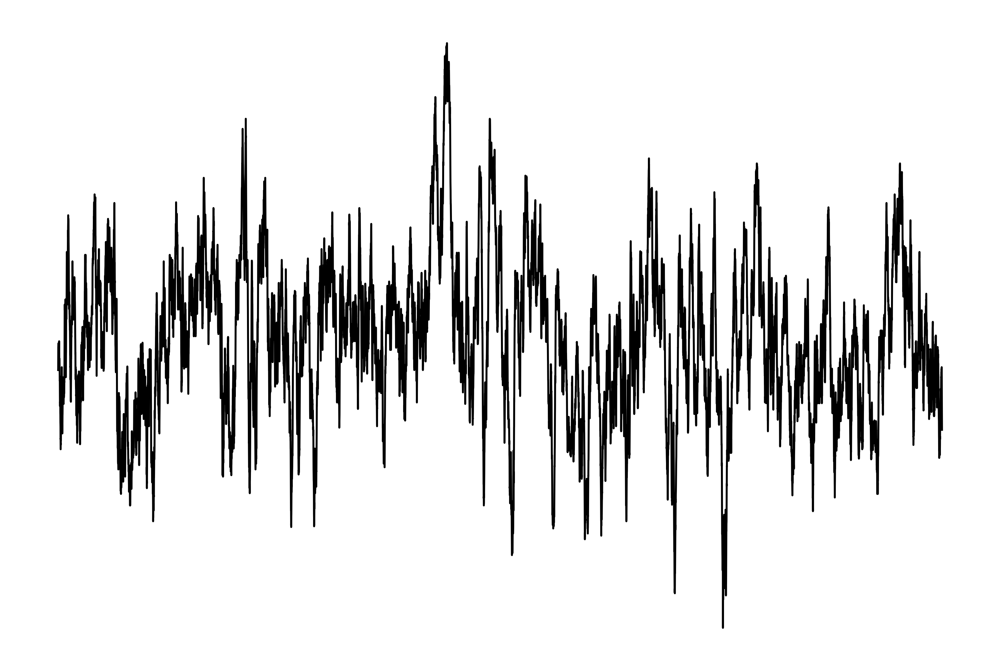

In [93]:
fig_dir = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/SWB/presentations/comittee_mtg_02012024/figs/anat_info/'
# Sanity check one channel data
fig, ax = plt.subplots(figsize=(9, 6), dpi=500)

sns.lineplot(ax=ax,data=scipy.stats.zscore(mne_data._data[15,400000:420000]),color="black",linewidth=1)
# sns.lineplot(ax=ax,data=mne_data._data[15,400000:420000],color="black",linewidth=1)

ax.axis('off')
# plt.xlabel('time (ms)')
# plt.ylabel('mV zscore')
sns.despine()
# plt.title("Raw iEEG, electrode 0, samples 0-4999")
# plt.show()
plt.savefig(f'{fig_dir}lfp_raw_fig_noaxis.png', dpi=500, format='png', metadata=None,
# plt.savefig(f'{fig_dir}lfp_raw_fig_noaxis.png', dpi=500, format='png', metadata=None,
bbox_inches='tight', pad_inches=0.1,
facecolor='auto', edgecolor='auto',
backend=None) 



In [133]:
# Set some spectrogram parameters 
freqs = np.logspace(*np.log10([2, 200]), num=30)
n_cycles = 3
sr = 500.0 
buf = 1.0
buf_ix = int(buf*sr)


In [134]:
freqs

array([  2.        ,   2.3442046 ,   2.74764759,   3.22052406,
         3.77478364,   4.42443258,   5.18588759,   6.07839076,
         7.12449578,   8.35063787,   9.78780184,  11.47230502,
        13.44671507,  15.76092563,  18.47341714,  21.65273468,
        25.37922006,  29.74704215,  34.86657644,  40.86719436,
        47.9005324 ,  56.14432408,  65.80689125,  77.13240842,
        90.40707313, 105.96633813, 124.20338838, 145.57907688,
       170.63357048, 200.        ])

In [ ]:
# #salman implementation
# ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
#                                     freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
#                                     use_fft=True, output='power', n_jobs=1)

# #mne base function
# mne.time_frequency.tfr_morlet(inst, freqs, n_cycles, use_fft=False, 
#                               return_itc=True, decim=1, n_jobs=None, picks=None, zero_mean=True, 
#                               average=True, output='power', verbose=None)

In [111]:
# plot one wavelet with same input parameters salman gave: 

from scipy import signal
#https://github.com/neurodsp-tools/neurodsp/blob/main/tutorials/timefreq/plot_MorletWavelet.py

In [160]:
# Set some spectrogram parameters 

# Define settings for a new wavelet
freq = 15 #just beta wavelet
n_cycles = 3  
omega = n_cycles
scaling = 1.0 #this is the default 
fs = 500 #sampling rate - 
wavelet_len = int(n_cycles * fs / freq) #length of wavelet 
#f = 2*s*w*r / M gives freq in Hz, so solving for M(length) = 2*scaling*omega*samprate/f

# freqs = np.logspace(*np.log10([2, 200]), num=30)
# n_cycles = 3
# sr = 500.0 
# buf = 1.0
# buf_ix = int(buf*sr)


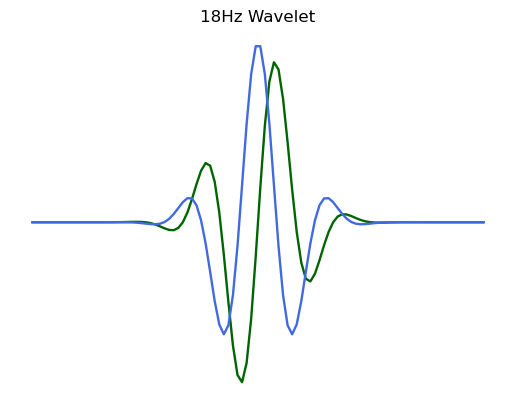

In [163]:
# Create wavelet
wavelet = signal.morlet(wavelet_len, omega, scaling)

# pi**-0.25 * exp(1j*w*x) * exp(-0.5*(x**2))
# pi**-0.25 * (exp(1j*w*x) - exp(-0.5*(w**2))) * exp(-0.5*(x**2)) wavelet equations!


# Plot wavelet
fig, ax = plt.subplots()
ax.plot(np.imag(wavelet),linewidth=1.7,color='darkgreen')
ax.plot(np.real(wavelet),linewidth=1.7,color='royalblue')
ax.set_axis_off()
plt.title('18Hz Wavelet')
plt.show()
#this will have higher temporal resolution but worse freq resolution!

fig.savefig(f'{fig_dir}18Hz_wavelet_real_imag.pdf', dpi=500, format='pdf', metadata=None,
# plt.savefig(f'{fig_dir}lfp_raw_fig_noaxis.png', dpi=500, format='png', metadata=None,
bbox_inches='tight', pad_inches=0.1,
facecolor='auto', edgecolor='auto',
backend=None) 


In [118]:
wavelet

array([ 1.98715387e-09+1.47653986e-24j,  4.96210492e-09+2.80772608e-09j,
        8.22415268e-09+1.36460035e-08j,  1.35791474e-09+4.33002127e-08j,
       -5.25325635e-08+1.01683045e-07j, -2.44086024e-07+1.62790596e-07j,
       -7.26461254e-07+6.11492026e-08j, -1.60263382e-06-7.15710767e-07j,
       -2.46426927e-06-3.27080648e-06j, -1.27823390e-06-9.17910654e-06j,
        7.39853778e-06-1.89773872e-05j,  3.36804892e-05-2.75890189e-05j,
        8.92831732e-05-1.54836557e-05j,  1.73033007e-04+6.18653492e-05j,
        2.37550742e-04+2.74526126e-04j,  1.39642477e-04+6.84010865e-04j,
       -3.95332268e-04+1.24371193e-03j, -1.72214317e-03+1.62552795e-03j,
       -4.03511487e-03+1.03873810e-03j, -6.87936877e-03-1.77091921e-03j,
       -8.53389543e-03-8.05512912e-03j, -5.69410806e-03-1.79136151e-02j,
        5.84610164e-03-2.86359646e-02j,  2.89061721e-02-3.34054922e-02j,
        6.11995917e-02-2.18809935e-02j,  9.17856023e-02+1.59176316e-02j,
        1.00639556e-01+8.24378352e-02j,  6.42571698

In [119]:
# # Plot wavelet
# _, ax = plt.subplots()
# ax.plot(np.real(wavelet))
# ax.plot(np.imag(wavelet))
# ax.set_axis_off()
# plt.title('Beta Freq Wavelet - 3 cycles')

# #this will have higher temporal resolution but worse freq resolution!


Text(0.5, 1.0, 'Beta Freq Wavelet - 3 cycles')

In [124]:
# n_cycles = 3
# omega = n_cycles
# wavelet_len = int(n_cycles * fs / freq) #length of wavelet 
# wavelet = signal.morlet(wavelet_len, omega, scaling)

# # Plot wavelet
# _, ax = plt.subplots()
# ax.plot(np.real(wavelet))
# ax.plot(np.imag(wavelet))
# ax.set_axis_off()
# plt.title('Beta 20Hz Wavelet - 10 cycles')
# plt.show()


# #this will have higher frequency resolution but worse temporal resolution!


### Resampling data 

In [9]:
#resampling if patient is not sampled at 512
resample_sr = 500
mne_data.resample(sfreq=resample_sr, npad='auto', n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   10.9s
[Paralle

<RawEDF | MS002_SWB.edf, 276 x 1083500 (2167.0 s), ~2.23 GB, data loaded>

### Photodiode
- examine photodiode 

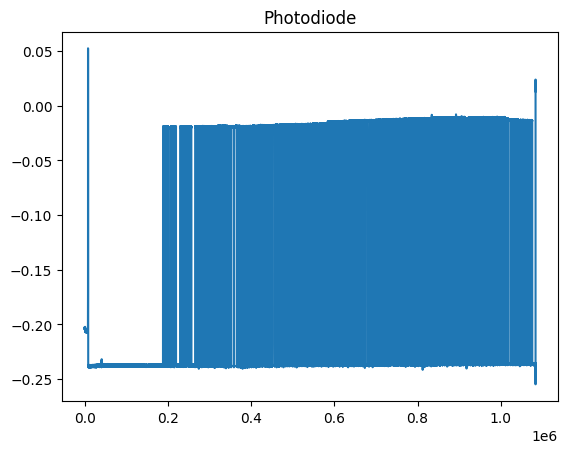

In [10]:
# Sanity check the photodiode
trig_ix = mne_data.ch_names.index("DC1")
plt.plot(mne_data._data[trig_ix])
plt.title("Photodiode")
plt.show()

In [11]:
mne_data.save(f'{neural_dir}{subj_id}/photodiode.fif', picks='DC1', overwrite=True)

Overwriting existing file.
Writing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/photodiode.fif
Closing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/photodiode.fif
[done]


In [12]:
mne_data.drop_channels(['DC1'])

<RawEDF | MS002_SWB.edf, 275 x 1083500 (2167.0 s), ~2.22 GB, data loaded>

### Notch filter line noise

In [13]:
mne_data.info['line_freq'] = 60
# Notch out 60 Hz noise and harmonics 
mne_data.notch_filter(freqs=(60, 120, 180, 240))

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 275 out of 275 | elapsed:    9.8s finished


<RawEDF | MS002_SWB.edf, 275 x 1083500 (2167.0 s), ~2.22 GB, data loaded>

### Anatomical Localization

In [14]:
### Rename channels to be lowercase before anatomical localization
new_name_dict = {x:x.replace(" ", "").lower() for x in mne_data.ch_names}
mne_data.rename_channels(new_name_dict)

<RawEDF | MS002_SWB.edf, 275 x 1083500 (2167.0 s), ~2.22 GB, data loaded>

In [15]:
# Load the electrode localization data
anat_file = glob(f'{anat_dir}{subj_id}_labels.csv')[0]
elec_locs = pd.read_csv(anat_file)
# Sometimes there's extra columns with no entries: 
elec_locs = elec_locs[elec_locs.columns.drop(list(elec_locs.filter(regex='Unnamed')))]

elec_locs

,label,BN246label,x,y,z,mni_x,mni_y,mni_z,gm,NMM,Anat,AnatMacro,BN246,YBA_1,ManualExamination,Notes
0,LaCaS1,A32sg_L,-6.784557,49.555827,0.149337,-6.382462,37.158688,-3.130044,Gray,Left ACgG anterior cingulate gyrus,Unknown,L ACC,L CG,Left cingulate gyrus D,NaN,NaN
1,LaCaS10,A9l_L,-8.380923,61.155821,43.676991,-8.220073,48.757099,44.868611,Gray,Left SFG superior frontal gyrus,Unknown,L Superior Medial Gyrus,L SFG,Left superior frontal gyrus 2 C,NaN,NaN
2,LaCaS11,A9l_L,-8.780014,62.355821,48.469026,-8.542609,49.887710,50.203768,Unknown,Left SFG superior frontal gyrus,Unknown,L Superior Medial Gyrus,L SFG,Left superior frontal gyrus 2 C,OOB,NaN
3,LaCaS12,Unknown,-8.780014,63.555820,53.261062,-8.436667,51.044299,55.539730,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,OOB,NaN
4,LaCaS2,A32sg_L,-6.784557,50.755827,4.941372,-6.368174,38.606223,2.270621,Gray,Left ACgG anterior cingulate gyrus,Unknown,L ACC,L CG,Left cingulate gyrus E,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,RmOIF5,A12/47o_R,33.922762,42.355831,-8.636061,34.666463,28.882016,-13.444118,White,Right Cerebral White Matter,Unknown,R IFG (p Orbitalis),R OrG,Right frontal orbital 4 D,WM,NaN
154,RmOIF6,A12/47l_R,37.913675,41.555831,-6.240044,38.716568,28.139395,-11.063832,Gray,Right Cerebral White Matter,Unknown,R IFG (p Orbitalis),R OrG,Right frontal orbital 4 D,NaN,NaN
155,RmOIF7,A12/47l_R,41.904589,40.755832,-3.844026,42.794042,27.279509,-8.584441,Gray,Right OrIFG orbital part of the inferior front...,Unknown,R IFG (p Orbitalis),R OrG,Right pars orbitalis C,NaN,NaN
156,RmOIF8,A12/47l_R,46.294594,39.555832,-1.048672,47.308597,25.926043,-5.816665,Gray,Right OrIFG orbital part of the inferior front...,Unknown,R IFG (p Orbitalis),R OrG,Right middle pars triangularis B,NaN,NaN


In [24]:
list(elec_locs.label)

['LaCaS1',
 'LaCaS10',
 'LaCaS11',
 'LaCaS12',
 'LaCaS2',
 'LaCaS3',
 'LaCaS4',
 'LaCaS5',
 'LaCaS6',
 'LaCaS7',
 'LaCaS8',
 'LaCaS9',
 'LAgIT1',
 'LAgIT10',
 'LAgIT2',
 'LAgIT3',
 'LAgIT4',
 'LAgIT5',
 'LAgIT6',
 'LAgIT7',
 'LAgIT8',
 'LAgIT9',
 'LaImS1',
 'LaImS10',
 'LaImS11',
 'LaImS12',
 'LaImS13',
 'LaImS14',
 'LaImS2',
 'LaImS3',
 'LaImS4',
 'LaImS5',
 'LaImS6',
 'LaImS7',
 'LaImS8',
 'LaImS9',
 'LHplT1',
 'LHplT10',
 'LHplT11',
 'LHplT12',
 'LHplT2',
 'LHplT3',
 'LHplT4',
 'LHplT5',
 'LHplT6',
 'LHplT7',
 'LHplT8',
 'LHplT9',
 'LlOiF1',
 'LlOiF10',
 'LlOiF2',
 'LlOiF3',
 'LlOiF4',
 'LlOiF5',
 'LlOiF6',
 'LlOiF7',
 'LlOiF8',
 'LlOiF9',
 'LmOIF1',
 'LmOIF10',
 'LmOIF11',
 'LmOIF12',
 'LmOIF13',
 'LmOIF14',
 'LmOIF2',
 'LmOIF3',
 'LmOIF4',
 'LmOIF5',
 'LmOIF6',
 'LmOIF7',
 'LmOIF8',
 'LmOIF9',
 'LpIpS1',
 'LpIpS10',
 'LpIpS11',
 'LpIpS12',
 'LpIpS13',
 'LpIpS14',
 'LpIpS2',
 'LpIpS3',
 'LpIpS4',
 'LpIpS5',
 'LpIpS6',
 'LpIpS7',
 'LpIpS8',
 'LpIpS9',
 'LsiF1',
 'LsiF2',
 'LsiF3',
 

In [17]:
anat_names = list(elec_locs.label.str.lower())
sum([ch not in mne_data.ch_names for ch in anat_names]) #if there are no missing channels, sum = 0. if sum >0, find the missing elecs
print([ch for ch in mne_data.ch_names if ch not in anat_names ]) #print extra channels in mne_data.ch_names and make sure none of them are neural channels (will be EEG etc.)

['lmolf1', 'lmolf2', 'lmolf3', 'lmolf4', 'lmolf5', 'lmolf6', 'lmolf7', 'lmolf8', 'lmolf9', 'lmolf10', 'lmolf11', 'lmolf12', 'lmolf13', 'lmolf14', 'rmolf1', 'rmolf2', 'rmolf3', 'rmolf4', 'rmolf5', 'rmolf6', 'rmolf7', 'rmolf8', 'rmolf9', 'rmolf10', 'rmolf11', 'rmolf12', 'c63', 'c64', 'lalms1', 'lalms2', 'lalms3', 'lalms4', 'lalms5', 'lalms6', 'lalms7', 'lalms8', 'lalms9', 'lalms10', 'lalms11', 'lalms12', 'lalms13', 'lalms14', 'ralms1', 'ralms2', 'ralms3', 'ralms4', 'ralms5', 'ralms6', 'ralms7', 'ralms8', 'ralms9', 'ralms10', 'ralms11', 'ralms12', 'ralms13', 'ralms14', 'lslif1', 'lslif2', 'lslif3', 'lslif4', 'lslif5', 'lslif6', 'lslif7', 'lslif8', 'lplps1', 'lplps2', 'lplps3', 'lplps4', 'lplps5', 'lplps6', 'lplps7', 'lplps8', 'lplps9', 'lplps10', 'lplps11', 'lplps12', 'lplps13', 'lplps14', 'laglt1', 'laglt2', 'laglt3', 'laglt4', 'laglt5', 'laglt6', 'laglt7', 'laglt8', 'laglt9', 'laglt10', 'c125', 'c126', 'c127', 'c128', 'raglt1', 'raglt2', 'raglt3', 'raglt4', 'raglt5', 'raglt6', 'raglt7',

In [19]:
new_mne_names, unmatched_names, unmatched_seeg = lfp_preprocess_utils.match_elec_names(mne_data.ch_names, elec_locs.label)


Number of electrodes in the mne file is greater than the number of electrodes in the localization file
        name  lev_score
273  lloif10   0.857143
274  lmolf10   0.857143
We have too many possible matches for lmoif10! Select one manually from these candidates:lmolf10
       name  lev_score
273  lloif9   0.833333
274  lmolf9   0.833333
We have too many possible matches for lmoif9! Select one manually from these candidates:lmolf9
       name  lev_score
273  lloif6   0.833333
274  lmolf6   0.833333
We have too many possible matches for lmoif6! Select one manually from these candidates:lmolf6
       name  lev_score
273  lloif1   0.833333
274  lmolf1   0.833333
We have too many possible matches for lmoif1! Select one manually from these candidates:lmolf1
       name  lev_score
273  lloif5   0.833333
274  lmolf5   0.833333
We have too many possible matches for lmoif5! Select one manually from these candidates:lmolf5
       name  lev_score
273  lloif7   0.833333
274  lmolf7   0.833333
We 

In [20]:
unmatched_seeg #make sure there are no unmatched names


[]

In [21]:
new_name_dict = {x:y for (x,y) in zip(mne_data.ch_names, new_mne_names)}


In [22]:
new_name_dict #make sure this passes the eye test 


{'lloif1': 'lloif1',
 'lloif2': 'lloif2',
 'lloif3': 'lloif3',
 'lloif4': 'lloif4',
 'lloif5': 'lloif5',
 'lloif6': 'lloif6',
 'lloif7': 'lloif7',
 'lloif8': 'lloif8',
 'lloif9': 'lloif9',
 'lloif10': 'lloif10',
 'lmolf1': 'lmoif1',
 'lmolf2': 'lmoif2',
 'lmolf3': 'lmoif3',
 'lmolf4': 'lmoif4',
 'lmolf5': 'lmoif5',
 'lmolf6': 'lmoif6',
 'lmolf7': 'lmoif7',
 'lmolf8': 'lmoif8',
 'lmolf9': 'lmoif9',
 'lmolf10': 'lmoif10',
 'lmolf11': 'lmoif11',
 'lmolf12': 'lmoif12',
 'lmolf13': 'lmoif13',
 'lmolf14': 'lmoif14',
 'rmolf1': 'rmoif1',
 'rmolf2': 'rmoif2',
 'rmolf3': 'rmoif3',
 'rmolf4': 'rmoif4',
 'rmolf5': 'rmoif5',
 'rmolf6': 'rmoif6',
 'rmolf7': 'rmoif7',
 'rmolf8': 'rmoif8',
 'rmolf9': 'rmoif9',
 'rmolf10': 'rmoif10',
 'rmolf11': 'rmoif11',
 'rmolf12': 'rmoif12',
 'lacas1': 'lacas1',
 'lacas2': 'lacas2',
 'lacas3': 'lacas3',
 'lacas4': 'lacas4',
 'lacas5': 'lacas5',
 'lacas6': 'lacas6',
 'lacas7': 'lacas7',
 'lacas8': 'lacas8',
 'lacas9': 'lacas9',
 'lacas10': 'lacas10',
 'lacas11': 'l

In [23]:
# Rename the mne data according to the localization data

mne_data.rename_channels(new_name_dict)

<RawEDF | MS002_SWB.edf, 275 x 1083500 (2167.0 s), ~2.22 GB, data loaded>

In [25]:
right_seeg_names = [i for i in mne_data.ch_names if i.startswith('r')]
left_seeg_names = [i for i in mne_data.ch_names if i.startswith('l')]
print(f'We have a total of {len(left_seeg_names)} left sEEG and {len(right_seeg_names)} right sEEG electrodes')
print(f'We have a total of {len(left_seeg_names) + len(right_seeg_names)} sEEG electrodes')



We have a total of 94 left sEEG and 64 right sEEG electrodes
We have a total of 158 sEEG electrodes


In [26]:
sEEG_mapping_dict = {f'{x}':'seeg' for x in left_seeg_names+right_seeg_names}
mne_data.set_channel_types(sEEG_mapping_dict)


<RawEDF | MS002_SWB.edf, 275 x 1083500 (2167.0 s), ~2.22 GB, data loaded>

In [27]:
drop_chans = list(set(mne_data.ch_names)^set(left_seeg_names+right_seeg_names))
mne_data.drop_channels(drop_chans) #number of chans should = number of seegs 

<RawEDF | MS002_SWB.edf, 158 x 1083500 (2167.0 s), ~1.28 GB, data loaded>

In [28]:
# make montage (convert mm to m)

montage = mne.channels.make_dig_montage(ch_pos=dict(zip(elec_locs.label, 
                                                        elec_locs[['mni_x', 'mni_y', 'mni_z']].to_numpy(dtype=float)/1000)),
                                        coord_frame='mni_tal')

mne_data.set_montage(montage, match_case=False, on_missing='warn')

<RawEDF | MS002_SWB.edf, 158 x 1083500 (2167.0 s), ~1.28 GB, data loaded>

## Signal Cleaning 
Methods:
- Use manual bad channel detection for **bipolar** referencing
    - bipolar referencing completely ignores channels labeled as 'bad' so do not remove unless absolutely necessary
- Remove additional channels as needed
- This process is iterative depending on how TFRs look. 

In [29]:
#this is just for my own personal info and to select how many channels to visualize at a time
ch_names = list(elec_locs.label.str.lower())
pattern = '[0-9]'
ch_names_no_num = [re.sub(pattern, '', i) for i in ch_names]
probe_names = np.unique(ch_names_no_num)

In [30]:
probe_names

array(['lacas', 'lagit', 'laims', 'lhplt', 'lloif', 'lmoif', 'lpips',
       'lsif', 'racas', 'ragit', 'raims', 'rhplt', 'rmoif'], dtype='<U5')

In [31]:
probe_ch_counts = {} #need this to select channel number for visualization
for p in probe_names:
    c = ch_names_no_num.count(p)
    probe_ch_counts[p] = c

In [32]:
probe_ch_counts

{'lacas': 12,
 'lagit': 10,
 'laims': 14,
 'lhplt': 12,
 'lloif': 10,
 'lmoif': 14,
 'lpips': 14,
 'lsif': 8,
 'racas': 14,
 'ragit': 12,
 'raims': 14,
 'rhplt': 12,
 'rmoif': 12}

### Compare auto detection result to actual lfp data - if trusted save auto result as mne bads
- often inaccurate - verify that all included channels make sense and all channels that should be included are
- take out any crazy noise, especially if it's only in one channel on probe (won't be cancelled out)

In [33]:
lfp_preprocess_utils.detect_bad_elecs(mne_data, sEEG_mapping_dict)
# mne_data.info['bads'] = lfp_preprocess_utils.detect_bad_elecs(mne_data, sEEG_mapping_dict) #this is likely inaccurate - just use to get an idea 
# mne_data.info['bads']

['lacas11',
 'laims6',
 'lloif2',
 'lmoif1',
 'lmoif11',
 'lmoif2',
 'ragit3',
 'rhplt11',
 'rhplt2']

Using matplotlib as 2D backend.


<IPython.core.display.Javascript object>


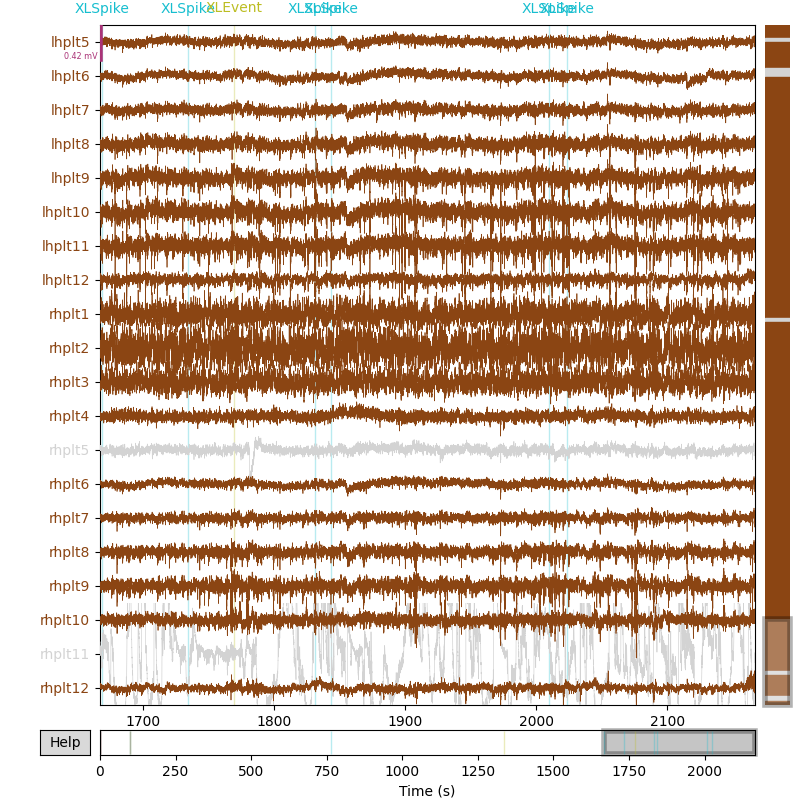

<IPython.core.display.Javascript object>


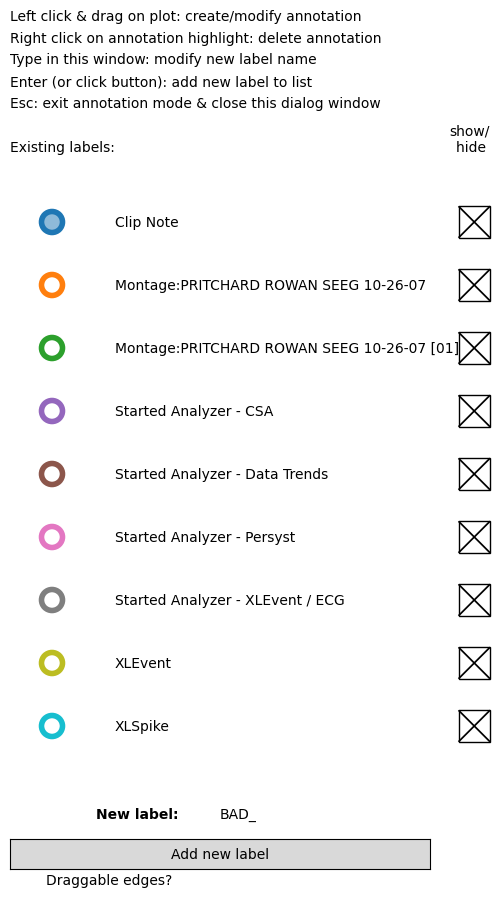

In [34]:
 %matplotlib notebook
fig = mne_data.plot(start=0, duration=500, n_channels=20, scalings=mne_data._data.max()/50)
fig.fake_keypress('a')

In [36]:
mne_data.info['bads']

['lmoif1', 'lmoif2', 'lloif4', 'laims7', 'rhplt11', 'rhplt5']

In [37]:
# #add manually for situations where raw data needs to be updated but manual bad channel inspection does not change 

mne_data.info['bads'] = ['lmoif1', 'lmoif2', 'lloif4', 'laims7', 'rhplt11', 'rhplt5']

In [38]:
mne_data.info #sanity check that bads info saved

<Info | 10 non-empty values
 bads: 6 items (lmoif1, lmoif2, lloif4, laims7, rhplt11, rhplt5)
 ch_names: lloif1, lloif2, lloif3, lloif4, lloif5, lloif6, lloif7, lloif8, ...
 chs: 158 sEEG
 custom_ref_applied: False
 dig: 158 items (158 EEG)
 highpass: 0.0 Hz
 line_freq: 60.0
 lowpass: 250.0 Hz
 meas_date: 2001-01-01 15:59:08 UTC
 nchan: 158
 projs: []
 sfreq: 500.0 Hz
>

# Bipolar Re-referencing 
- plot lfp bp data
- plot psd bp data
- save bp reref data 


In [39]:
#run if only re-ref
anat_file = glob(f'{anat_dir}/{subj_id}_labels.csv')[0]
# mne_data = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/raw_ieeg.fif', preload=True)

### Bipolar Re-ref

In [40]:
# Re-reference neural data
mne_data_bp_reref = lfp_preprocess_utils.ref_mne(mne_data=mne_data, 
                                              elec_path=anat_file, 
                                              method='bipolar', 
                                              site='MSSM')

sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=58, n_times=1083500
    Range : 0 ... 1083499 =      0.000 ...  2166.998 secs
Ready.
Added the following bipolar channels:
lacas1-lacas2, lacas2-lacas3, lacas3-lacas4, lacas4-lacas5, lacas5-lacas6, lacas6-lacas7, lacas7-lacas8, lagit1-lagit2, lagit2-lagit3, lagit3-lagit4, laims1-laims2, laims2-laims3, laims3-laims4, laims4-laims5, laims5-laims6, laims11-laims12, laims12-laims13, lhplt1-lhplt2, lhplt2-lhplt3, lhplt3-lhplt4, lhplt9-lhplt10, lhplt10-lhplt11, lhplt11-lhplt12, lloif1-lloif2, lloif2-lloif3, lloif7-lloif8, lloif8-lloif9, lmoif11-lmoif12, lmoif12-lmoif13, lpips1-lpips2, lpips10-lpips11, lsif6-lsif7, lsif7-lsif8, racas2-racas3, racas7-racas8, racas8-racas9, racas12-racas13, ragit1-ragit2, ragit2-ragit3, ragit7-ragit8, ragit8-ragit9, ragit9-ragit10, raims1-raims2, raims2-raims3, raims3-raims4, raims11-raims12, raims12-raims13, raims13-raims14, rhplt1-rhplt2, rhplt2-rhplt3, rhplt8-rhplt9

In [41]:
mne_data_bp_reref

<RawEDF | MS002_SWB.edf, 58 x 1083500 (2167.0 s), ~479.6 MB, data loaded>

<IPython.core.display.Javascript object>


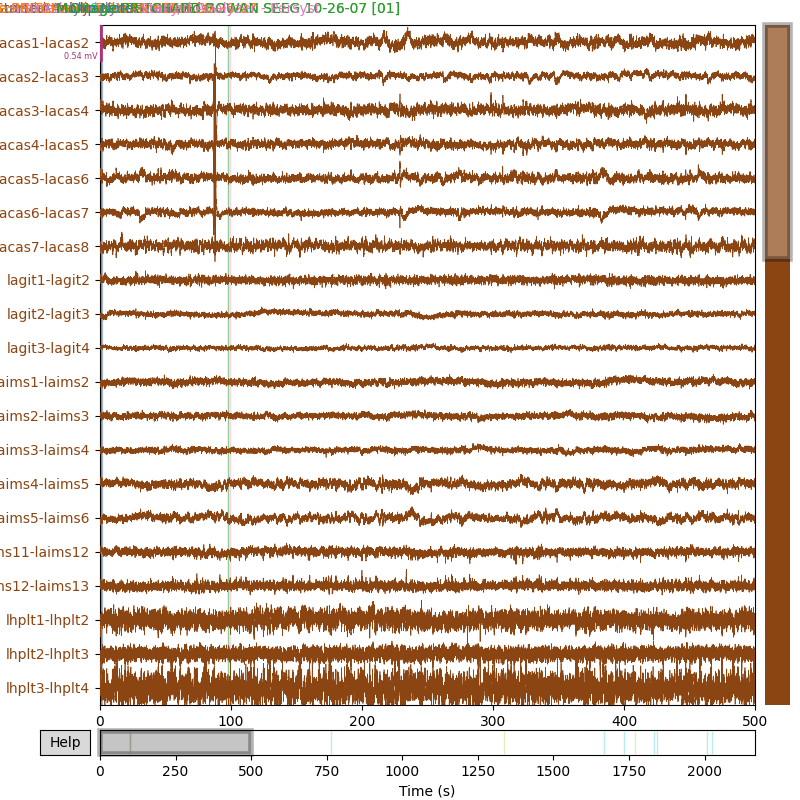

<IPython.core.display.Javascript object>


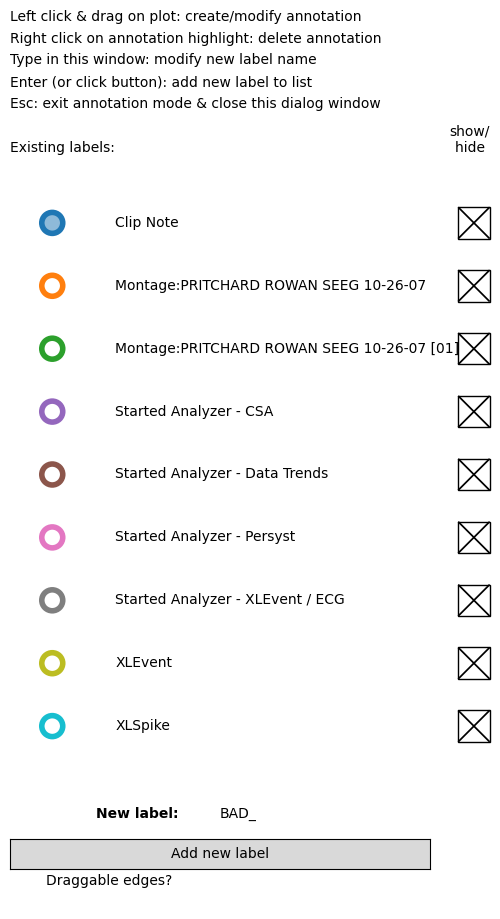

In [120]:
 %matplotlib notebook
fig = mne_data_bp_reref.plot(start=0, duration=500, n_channels=20, scalings=mne_data_bp_reref._data.max()/5)
fig.fake_keypress('a')

In [44]:
mne_data_bp_reref.ch_names

['lacas1-lacas2',
 'lacas2-lacas3',
 'lacas3-lacas4',
 'lacas4-lacas5',
 'lacas5-lacas6',
 'lacas6-lacas7',
 'lacas7-lacas8',
 'lagit1-lagit2',
 'lagit2-lagit3',
 'lagit3-lagit4',
 'laims1-laims2',
 'laims2-laims3',
 'laims3-laims4',
 'laims4-laims5',
 'laims5-laims6',
 'laims11-laims12',
 'laims12-laims13',
 'lhplt1-lhplt2',
 'lhplt2-lhplt3',
 'lhplt3-lhplt4',
 'lhplt9-lhplt10',
 'lhplt10-lhplt11',
 'lhplt11-lhplt12',
 'lloif1-lloif2',
 'lloif2-lloif3',
 'lloif7-lloif8',
 'lloif8-lloif9',
 'lmoif11-lmoif12',
 'lmoif12-lmoif13',
 'lpips1-lpips2',
 'lpips10-lpips11',
 'lsif6-lsif7',
 'lsif7-lsif8',
 'racas2-racas3',
 'racas7-racas8',
 'racas8-racas9',
 'racas12-racas13',
 'ragit1-ragit2',
 'ragit2-ragit3',
 'ragit7-ragit8',
 'ragit8-ragit9',
 'ragit9-ragit10',
 'raims1-raims2',
 'raims2-raims3',
 'raims3-raims4',
 'raims11-raims12',
 'raims12-raims13',
 'raims13-raims14',
 'rhplt1-rhplt2',
 'rhplt2-rhplt3',
 'rhplt8-rhplt9',
 'rhplt9-rhplt10',
 'rmoif1-rmoif2',
 'rmoif2-rmoif3',
 'rmoif

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


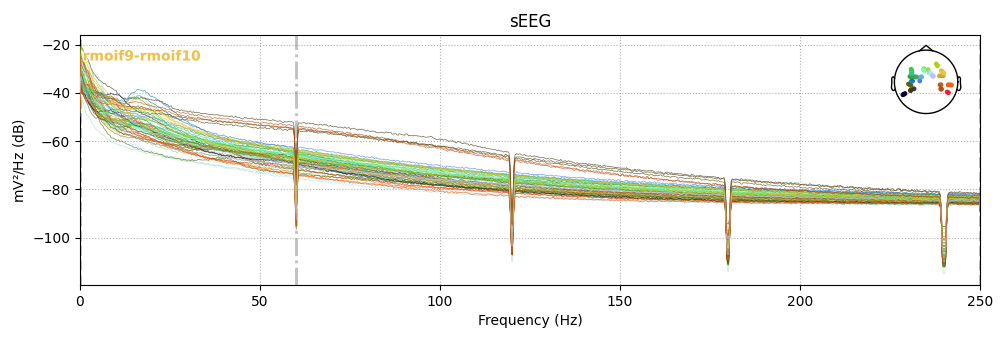

<IPython.core.display.Javascript object>


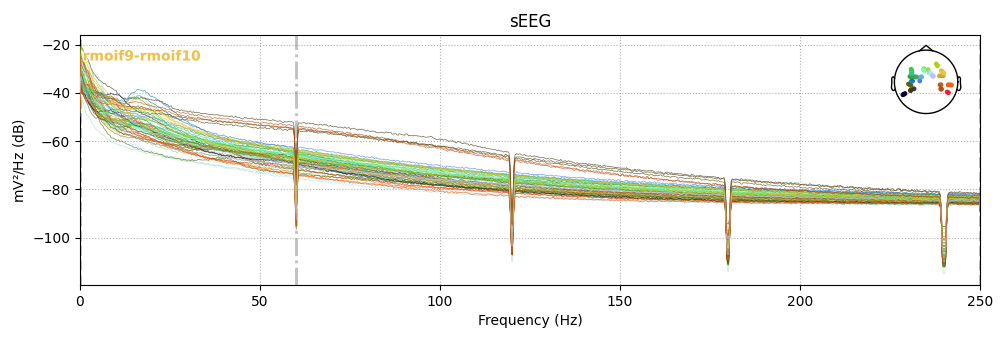

In [119]:
# mne_data_bp_reref.plot_psd(picks=['lacas1-lacas2'])
mne_data_bp_reref.plot_psd()

In [45]:
mne_data_bp_reref.save(f'{neural_dir}{subj_id}/bp_ref_ieeg.fif',overwrite=True)

Overwriting existing file.
Writing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/bp_ref_ieeg.fif
Closing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/bp_ref_ieeg.fif
[done]


## Save mne_data

In [46]:
mne_data.save(f'{neural_dir}{subj_id}/raw_ieeg.fif',overwrite=True)

Overwriting existing file.
Writing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/raw_ieeg.fif
Closing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/raw_ieeg.fif
[done]


# Epoching + TFRs
- Check whether data is ready to be analyzed - if this step shows noise then steps above should be repeated
- Align photodiode to behavior 
- Epoch data (and mark bad epochs)
- Baseline data
- Visualize TFRs 

In [47]:
#remove mne_data from environment to save memory 
del mne_data, mne_data_bp_reref

### Photodiode Alignment

In [48]:
#load behavior data
behav_df = pd.read_csv(f'{behav_dir}{subj_id}_pt_task_data')
behav_df = behav_df[behav_df.columns.drop(list(behav_df.filter(regex='Unnamed')))]
behav_df = behav_df[behav_df['FeedbackOnset'] != 0] #remove fail trials from behav df
beh_ts = behav_df['TrialOnset'] #timestamp that should be aligned to photodiode 
#load photodiode data
photodiode_data = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/photodiode.fif', preload=True)

Opening raw data file /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/photodiode.fif...
Isotrak not found
    Range : 0 ... 1083499 =      0.000 ...  2166.998 secs
Ready.
Reading 0 ... 1083499  =      0.000 ...  2166.998 secs...


In [49]:
photodiode_data

<Raw | photodiode.fif, 1 x 1083500 (2167.0 s), ~8.3 MB, data loaded>

In [55]:
photodiode_data.tmax

2166.998

In [56]:
beh_ts

0       513.380590
1       522.640856
2       531.174799
3       545.592613
4       555.337336
          ...     
144    2082.720686
145    2094.678701
146    2107.766044
147    2117.339199
148    2126.290743
Name: TrialOnset, Length: 148, dtype: float64

<IPython.core.display.Javascript object>


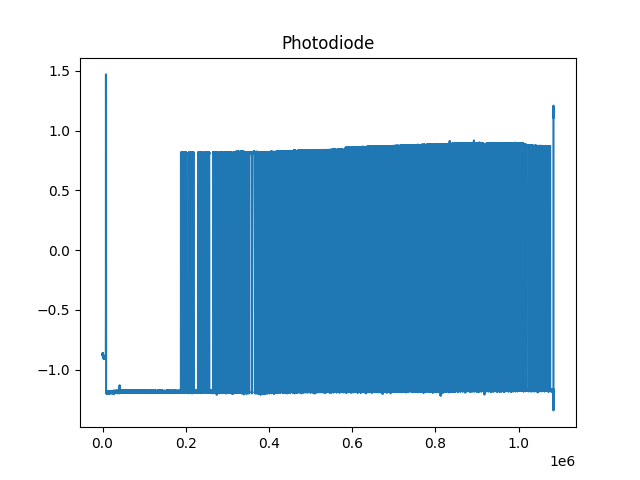

In [58]:
# Sanity check the photodiode
plt.plot(photodiode_data._data[0,:])
plt.plot(scipy.stats.zscore(photodiode_data._data[0,:]))
plt.title("Photodiode")
plt.show()

In [59]:
### Photodiode alignment
smoothSize=11
windSize=15
height=0.7


# Synchronize to the photodiode or whatever your neural sync signal is
slope, offset = sync_utils.synchronize_data(beh_ts, 
                                            photodiode_data, #
                                            smoothSize, windSize, height)

10 blocks
..........

found matches for 105 of 163 pulses


In [60]:
print(slope, offset,smoothSize,windSize,height)

0.9999810029450645 17.49842324841302 11 15 0.7


In [54]:
[(x*slope + offset) for x in beh_ts]

[530.8692604291438,
 540.1293510113519,
 548.6631318915682,
 563.0806710955815,
 572.8252096745297,
 581.3596579420671,
 594.5369507075575,
 603.7192535675307,
 612.5960761308419,
 627.1290725414648,
 637.712565882441,
 646.6790566422887,
 661.1999440829517,
 670.6293068494252,
 679.3225302006463,
 694.7495972262393,
 704.6638157817063,
 719.3612710680379,
 749.9431579912149,
 759.0925951755529,
 772.8822613075303,
 782.5528519912955,
 791.5579448178048,
 805.2874888919451,
 813.838058353224,
 824.3617409304479,
 838.4418041456345,
 847.4211832606333,
 855.7636634750676,
 878.5824632768396,
 887.4431194472694,
 901.6119736756528,
 914.2759624925924,
 922.5896799534439,
 937.4633401923362,
 946.197522865435,
 955.5613445770222,
 969.0727030961234,
 977.7737361989812,
 986.0687820145475,
 1001.1234571146231,
 1009.5009972630086,
 1018.9219071900675,
 1032.2069755080975,
 1040.8125590242503,
 1049.2277983564486,
 1062.3263929170002,
 1070.5169076183888,
 1079.308001410325,
 1093.242759185

In [837]:
# del epochs_all_baseline, power_epochs, plot_data

## Epoch Data
- Epoch neural data into trial epochs 
- Add behavioral data to epochs metadata
- Save epochs
- Baseline + decompose data into TFRs
- Plot + save TFRs (examine quality)

### Epoch data

In [83]:
# IED removal requires that we set some parameters for IED detection. 
# 1. peak_thresh: how many stds should they exceed the baseline by? 
# 2. closeness_thresh: how close should they be allowed to be (in sec) to other candidate IEDs? 
# 3. width_thresh: how wide should they have to be (in sec)?

# Defaults:
IED_args = {'peak_thresh':4,
           'closeness_thresh':0.25, 
           'width_thresh':0.2}

In [84]:
# Create a dictionary with your event name (matching your dataframe), and the time-window for the event
evs = {'TrialOnset': [-1.0, 0], #ITI is always at least one second + 10ms buffer for wavelet padding (no horizontal smearing)
       'DecisionOnset': [0, 5.0]} #1 sec decision period + 2 second outcome + 3 second counterfactual

In [85]:
epochs_all_evs = {f'{x}': np.nan for x in evs}

In [86]:
for event in evs.keys():
    # Make the epochs. 
    ev_epochs = lfp_preprocess_utils.make_epochs(load_path=f'{neural_dir}{subj_id}/bp_ref_ieeg.fif', 
                 slope=slope, offset=offset,
                 behav_name=event, behav_times=behav_df[event].values, 
                 ev_start_s=evs[event][0], ev_end_s=evs[event][1], buf_s = 1.0, IED_args=IED_args) #1.0 buf unsaved

    epochs_all_evs[event] = ev_epochs
    

Opening raw data file /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/bp_ref_ieeg.fif...
    Range : 0 ... 1083499 =      0.000 ...  2166.998 secs
Ready.
Reading 0 ... 1083499  =      0.000 ...  2166.998 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 25 - 80 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 25.00
- Lower transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 21.88 Hz)
- Upper passband edge: 80.00 Hz
- Upper transition bandwidth: 20.00 Hz (-6 dB cutoff frequency: 90.00 Hz)
- Filter length: 265 samples (0.530 sec)



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
ERROR: ld.so: object '/hpc/packages/minerva-centos7/xalt/3.0.1/lib64/libxalt_init.so' from LD_PRELOAD cannot be preloaded: ignored.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  55 out of  58 | elapsed:    4.6s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  58 out of  58 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done  58 out of  58 |

Used Annotations descriptions: ['TrialOnset']
Not setting metadata
148 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 148 events and 1501 original time points ...
0 bad epochs dropped
Adding metadata with 58 columns
Opening raw data file /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/bp_ref_ieeg.fif...
    Range : 0 ... 1083499 =      0.000 ...  2166.998 secs
Ready.
Reading 0 ... 1083499  =      0.000 ...  2166.998 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 25 - 80 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 25.00
- Lower transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 21.88 Hz)
- Upper passband edge: 80.00 Hz
- Upper transition bandwidth: 20.00 Hz (-

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  58 out of  58 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done  58 out of  58 | elapsed:    3.5s finished


Used Annotations descriptions: ['DecisionOnset']
Not setting metadata
148 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 148 events and 3501 original time points ...
0 bad epochs dropped
Adding metadata with 58 columns


In [87]:
epochs_all_evs 


{'TrialOnset': <Epochs |  148 events (all good), -2 - 1 sec, baseline off, ~98.4 MB, data loaded, with metadata,
  'TrialOnset': 148>,
 'DecisionOnset': <Epochs |  148 events (all good), -1 - 6 sec, baseline off, ~229.4 MB, data loaded, with metadata,
  'DecisionOnset': 148>}

### Add behavioral data to metadata 

In [88]:
behav_df.columns

Index(['Round', 'Trial Num', 'TrialType', 'TrialOnset', 'ChoiceOnset',
       'DecisionOnset', 'FeedbackOnset', 'RT', 'SafeBet', 'LowBet', 'HighBet',
       'HighBetPos', 'GamblePos', 'ChoicePos', 'GambleChoice', 'Outcome',
       'Profit', 'TotalProfit', 'GambleEV', 'CR', 'choiceEV', 'RPE',
       'totalCPE', 'decisionCPE', 'totalRegret', 'decisionRegret',
       'totalRelief', 'decisionRelief', 'totalCF', 'decisionCF', 'pRPE',
       'nRPE', 'util_safe_mle', 'util_gamble_mle', 'wSafe_mle', 'wHigh_mle',
       'wLow_mle', 'p_safe_mle', 'p_gamble_mle', 'util_safe_emmap',
       'util_gamble_emmap', 'wSafe_emmap', 'wHigh_emmap', 'wLow_emmap',
       'p_safe_emmap', 'p_gamble_emmap', 'util_tCPE_mle', 'util_dCPE_mle',
       'util_tCF_mle', 'util_dCF_mle', 'util_tRegret_mle', 'util_dRegret_mle',
       'util_tRelief_mle', 'util_dRelief_mle', 'util_RPE_mle', 'util_pRPE_mle',
       'util_nRPE_mle', 'util_tCPE_emmap', 'util_dCPE_emmap', 'util_tCF_emmap',
       'util_dCF_emmap', 'util_tRegr

In [89]:
behav_params = ['TrialType','SafeBet', 'LowBet', 'HighBet','GambleChoice', 'Outcome',
       'Profit', 'TotalProfit', 'GambleEV', 'CR', 'choiceEV', 'RPE',
       'totalCPE', 'decisionCPE', 'totalRegret', 'decisionRegret',
       'totalRelief', 'decisionRelief', 'totalCF', 'decisionCF', 'pRPE',
       'nRPE', 'util_safe_mle', 'util_gamble_mle', 'wSafe_mle', 'wHigh_mle',
       'wLow_mle', 'p_safe_mle', 'p_gamble_mle', 'util_safe_emmap',
       'util_gamble_emmap', 'wSafe_emmap', 'wHigh_emmap', 'wLow_emmap',
       'p_safe_emmap', 'p_gamble_emmap', 'util_tCPE_mle', 'util_dCPE_mle',
       'util_tCF_mle', 'util_dCF_mle', 'util_tRegret_mle', 'util_dRegret_mle',
       'util_tRelief_mle', 'util_dRelief_mle', 'util_RPE_mle', 'util_pRPE_mle',
       'util_nRPE_mle', 'util_tCPE_emmap', 'util_dCPE_emmap', 'util_tCF_emmap',
       'util_dCF_emmap', 'util_tRegret_emmap', 'util_dRegret_emmap',
       'util_tRelief_emmap', 'util_dRelief_emmap', 'util_RPE_emmap',
       'util_pRPE_emmap', 'util_nRPE_emmap']

In [90]:
for event in evs.keys():

    event_metadata = epochs_all_evs[event].metadata.copy()
    
    #independent vars
    for param in behav_params: 
        event_metadata[param] = behav_df[param].tolist()

    epochs_all_evs[event].metadata = event_metadata 
    

Replacing existing metadata with 116 columns
Replacing existing metadata with 116 columns


In [91]:
epochs_all_evs[event].metadata

,lacas1-lacas2,lacas2-lacas3,lacas3-lacas4,lacas4-lacas5,lacas5-lacas6,lacas6-lacas7,lacas7-lacas8,lagit1-lagit2,lagit2-lagit3,lagit3-lagit4,...,util_dCPE_emmap,util_tCF_emmap,util_dCF_emmap,util_tRegret_emmap,util_dRegret_emmap,util_tRelief_emmap,util_dRelief_emmap,util_RPE_emmap,util_pRPE_emmap,util_nRPE_emmap
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.316691,0.316691,0.316691,-0.316691,-0.316691,0.000000,0.000000,0.000000,0.000000,0.000000
1,NaN,noise,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.249038,0.000000,-0.904028,-1.153066,-0.249038,0.000000,0.000000,0.000000,0.000000,0.000000
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,noise,...,0.287099,0.000000,0.475010,0.000000,0.000000,0.762109,0.287099,0.000000,0.000000,0.000000
3,NaN,NaN,noise,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.002813,-1.002813,-1.002813,0.000000,0.000000,1.002813,1.002813,0.000000,0.000000,0.000000
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.026058,0.000000,0.569423,0.000000,0.000000,0.595481,0.026058,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.369044,-1.431695,-1.369044,0.000000,0.000000,1.431695,1.369044,1.431695,1.431695,0.000000
144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.112817,0.112817,0.112817,-0.112817,-0.112817,0.000000,0.000000,0.000000,0.000000,0.000000
145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.211004,0.000000,-1.369044,-1.580049,-0.211004,0.000000,0.000000,0.000000,0.000000,0.000000
146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.376010,0.433963,0.376010,-0.433963,-0.376010,0.000000,0.000000,-0.433963,0.000000,-0.433963


### Save raw epoched data 

In [92]:
for event in evs.keys():
    epochs_all_evs[event].save(f'{neural_dir}{subj_id}/bp_epoch_{event}.fif', overwrite=True)

Overwriting existing file.
Overwriting existing file.


### Baseline + Decompose into TFRs

In [93]:
# Explicitly define a list of analysis events and the baseline event. Should correspond to the dict
analysis_evs = ['DecisionOnset']
baseline_ev = 'TrialOnset'
evs = {'TrialOnset': [-1.0, 0], #maybe increase to full second to take cycles up to 4
       #ITI is always at least one second + 10ms buffer for wavelet padding (no horizontal smearing)
       'DecisionOnset': [0, 5.0]} #1 sec decision period + 2 second outcome + 3 second counterfactual

In [94]:
# Set some spectrogram parameters 
freqs = np.logspace(*np.log10([2, 200]), num=30)
n_cycles = 3
sr = 500.0 
buf = 1.0
buf_ix = int(buf*sr)

In [95]:
epochs_all_baseline = {} #removed unecessary 'decisiononset' empty key

In [96]:
#baseline epoch - 
event = 'TrialOnset'
epochs = epochs_all_evs[event]

good_chans = [x for x in epochs.ch_names if x not in epochs.info['bads']]
picks = [x for x in good_chans]

pow_struct = np.nan * np.ones([epochs._data.shape[0], 
                       epochs._data.shape[1], len(freqs), 
                       epochs._data.shape[-1]])

for ch_ix in np.arange(epochs._data.shape[1]): 
    ch_data = epochs._data[:, ch_ix:ch_ix+1, :]
    bad_epochs  = np.where(epochs.metadata[epochs.ch_names[ch_ix]].notnull())[0]
    good_epochs = np.delete(np.arange(ch_data.shape[0]), bad_epochs)
    ch_data = np.delete(ch_data, bad_epochs, axis=0)
    ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
                                        freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
                                        use_fft=True, output='power', n_jobs=1)

    pow_struct[good_epochs, ch_ix, :, :] = ch_pow[:, 0, :, :]

temp_pow = mne.time_frequency.EpochsTFR(epochs.info, pow_struct, 
                                        epochs.times, freqs)
temp_pow.crop(tmin=evs[event][0], tmax=evs[event][1])

epochs_all_baseline[event] = temp_pow


Not setting metadata


In [97]:
epochs_all_baseline

{'TrialOnset': <EpochsTFR | time : [-1.000000, 0.000000], freq : [2.000000, 200.000000], epochs : 148, channels : 58, ~984.4 MB>}

In [98]:
power_epochs = {}

In [100]:
event = 'DecisionOnset'

epochs = epochs_all_evs[event]

# Let's make sure we only do this for good channels
good_chans = [x for x in epochs.ch_names if x not in epochs.info['bads']]
picks = [x for x in good_chans]

pow_struct = np.nan * np.ones([epochs._data.shape[0], 
                       epochs._data.shape[1], len(freqs), 
                       epochs._data.shape[-1]])

for ch_ix in np.arange(epochs._data.shape[1]): 
    ch_data = epochs._data[:, ch_ix:ch_ix+1, :]
    bad_epochs  = np.where(epochs.metadata[epochs.ch_names[ch_ix]].notnull())[0] 
    good_epochs = np.delete(np.arange(ch_data.shape[0]), bad_epochs)
    ch_data = np.delete(ch_data, bad_epochs, axis=0) #this is where bad epochs for ch are deleted!!
    ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
                                        freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
                                        use_fft=True, output='power', n_jobs=1)

    pow_struct[good_epochs, ch_ix, :, :] = ch_pow[:, 0, :, :]

temp_pow = mne.time_frequency.EpochsTFR(epochs.info, pow_struct, 
                                        epochs.times, freqs)

temp_pow.crop(tmin=evs[event][0], tmax=evs[event][1])


baseline_corrected_power = lfp_preprocess_utils.baseline_trialwise_TFR(data=temp_pow.data, 
                                                  baseline_mne=epochs_all_baseline['TrialOnset'], 
                                                  mode='zscore', 
                                                  trialwise=False, ## make sure this is FALSE!
                                                  baseline_only=True)


zpow = mne.time_frequency.EpochsTFR(epochs.info, baseline_corrected_power, 
                                temp_pow.times, freqs)

zpow.metadata = epochs_all_evs[event].metadata

power_epochs[event] = zpow



Not setting metadata
Not setting metadata
Adding metadata with 116 columns


In [101]:
power_epochs['DecisionOnset']

<EpochsTFR | time : [0.000000, 5.000000], freq : [2.000000, 200.000000], epochs : 148, channels : 58, ~4.80 GB>

In [102]:
#conda install -c conda-forge h5io must install to save tfr data
power_epochs['DecisionOnset'].save(f'{neural_dir}{subj_id}/bp_pow_epochs-tfr.h5', overwrite=True)


## Plot TFRs

In [103]:
####add directory for TFRs
tfr_dir = f'{base_dir}ephys_analysis/figs/TFRs/{subj_id}/all_trials/'
os.makedirs(tfr_dir,exist_ok = True) #added so you don't have to manually make subject folders in clean_data
date = datetime.date.today().strftime('%m%d%Y')
print(date)

01252024


17.49842324841302


<IPython.core.display.Javascript object>


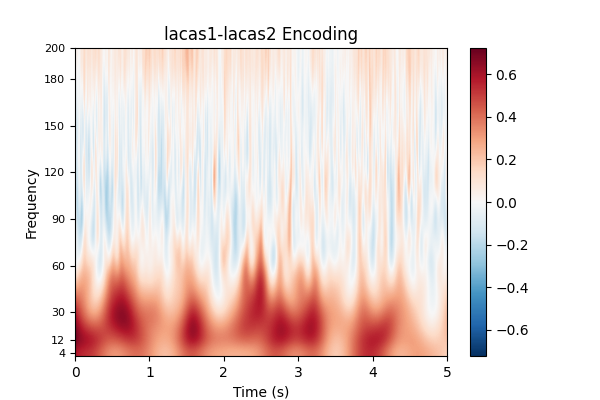

<IPython.core.display.Javascript object>


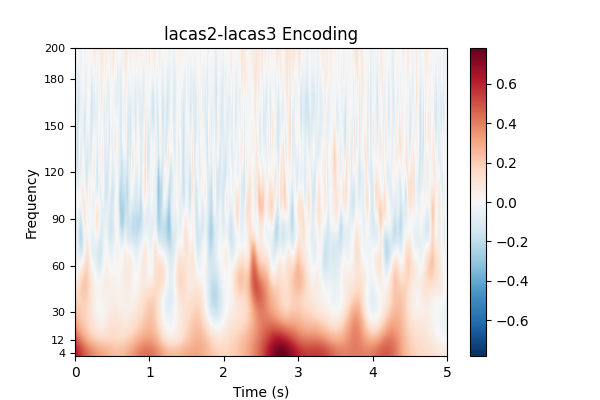

<IPython.core.display.Javascript object>


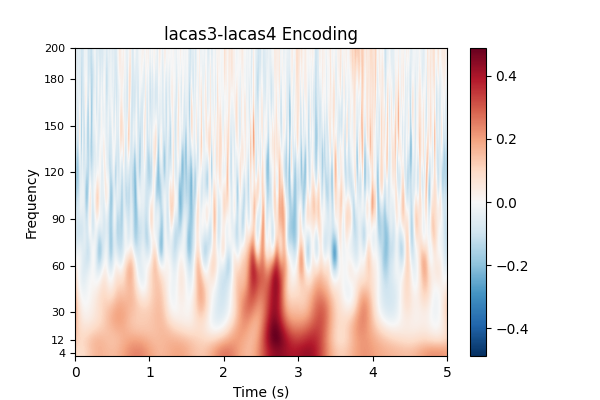

<IPython.core.display.Javascript object>


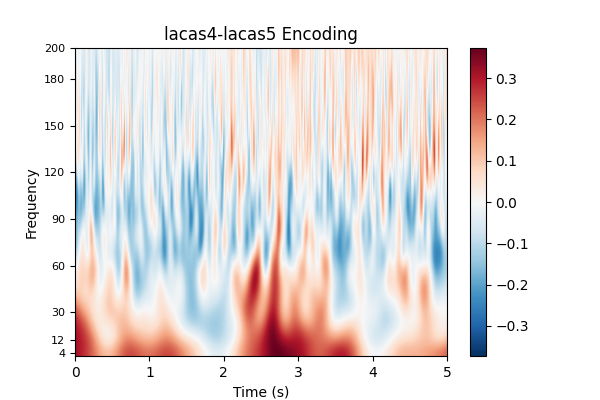

<IPython.core.display.Javascript object>


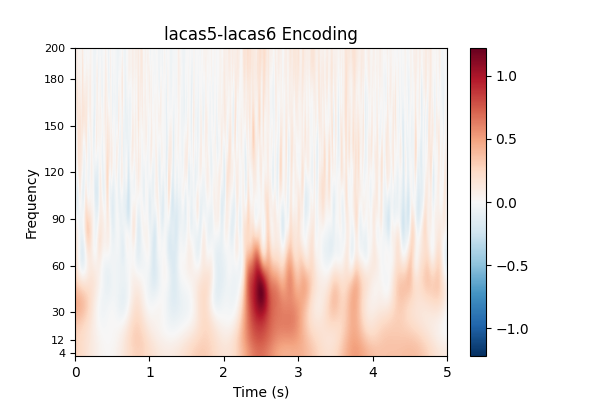

<IPython.core.display.Javascript object>


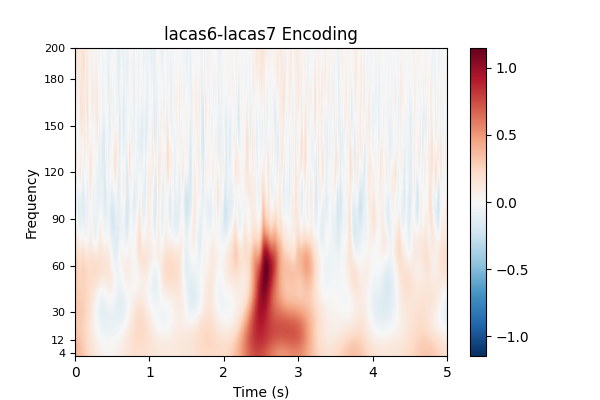

<IPython.core.display.Javascript object>


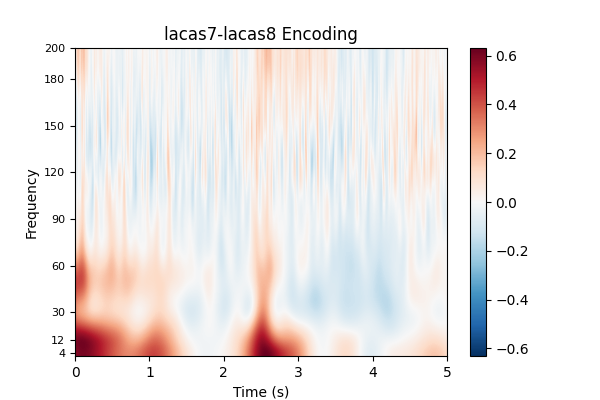

<IPython.core.display.Javascript object>


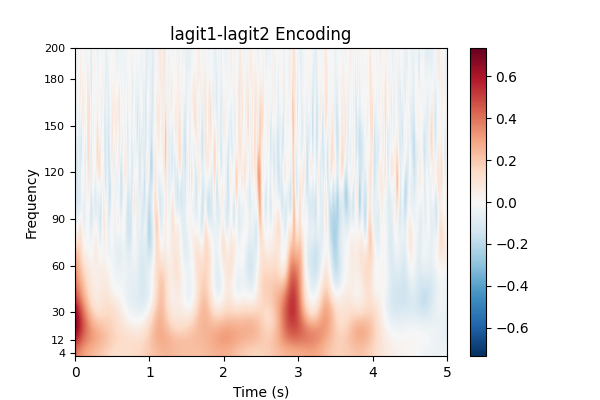

<IPython.core.display.Javascript object>


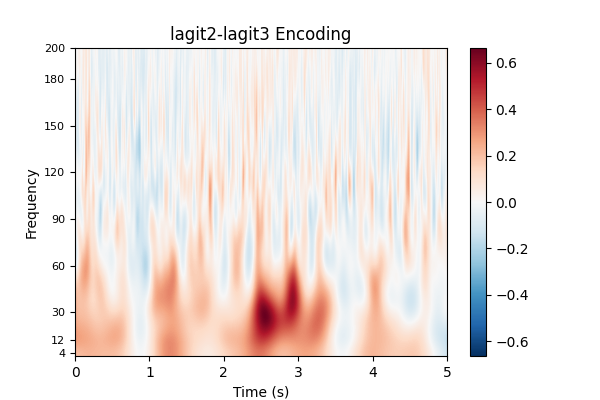

<IPython.core.display.Javascript object>


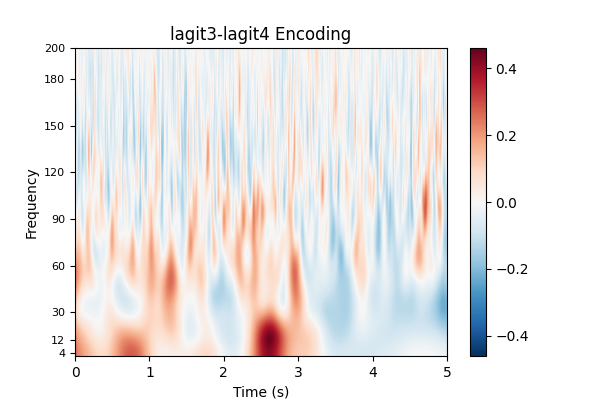

<IPython.core.display.Javascript object>


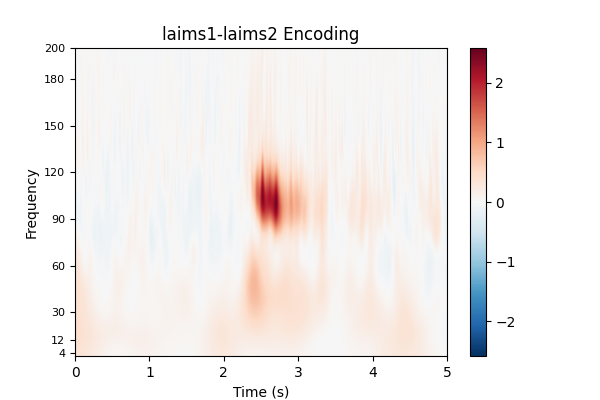

<IPython.core.display.Javascript object>


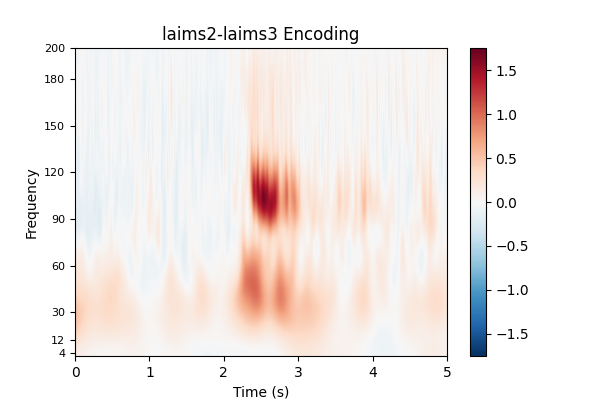

<IPython.core.display.Javascript object>


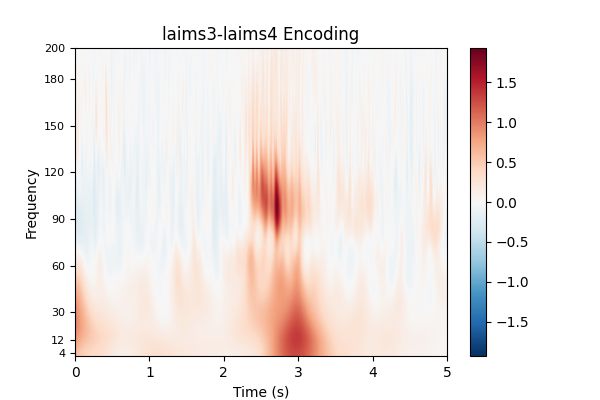

<IPython.core.display.Javascript object>


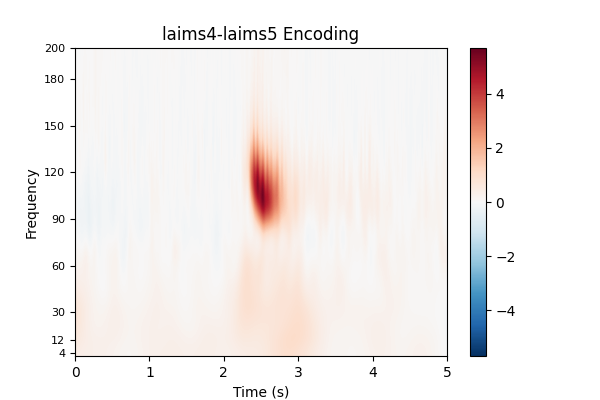

<IPython.core.display.Javascript object>


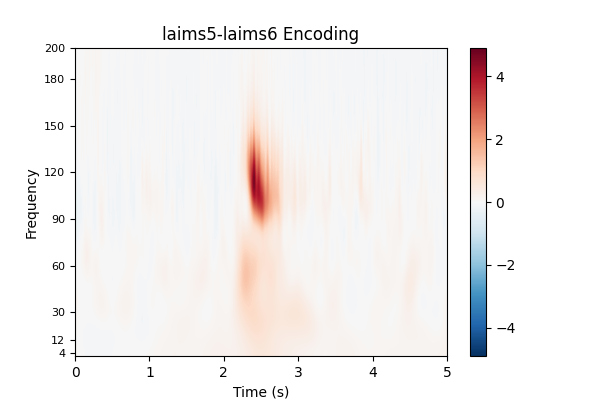

<IPython.core.display.Javascript object>


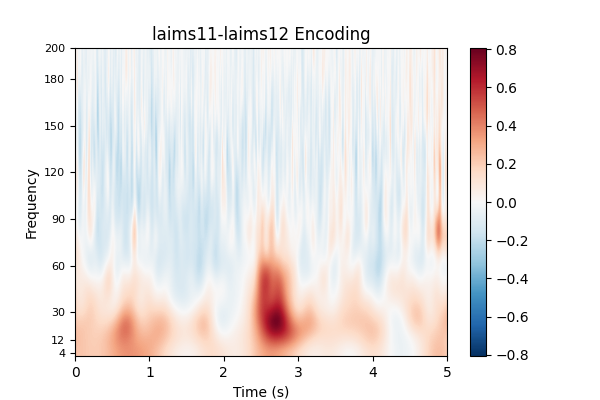

<IPython.core.display.Javascript object>


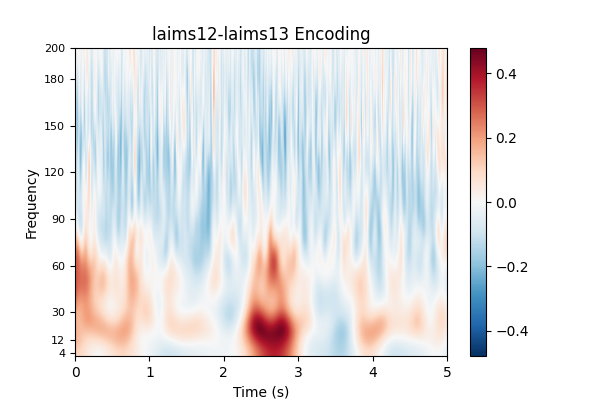

<IPython.core.display.Javascript object>


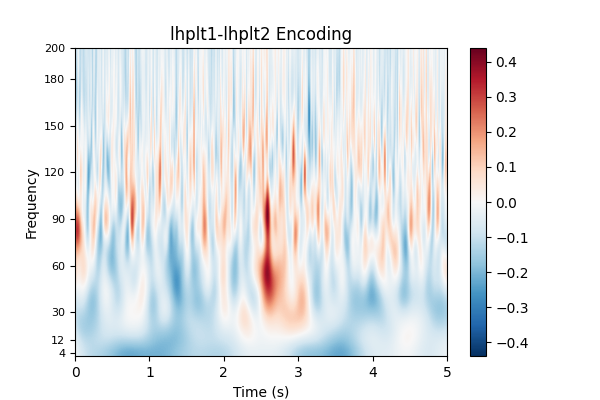

<IPython.core.display.Javascript object>


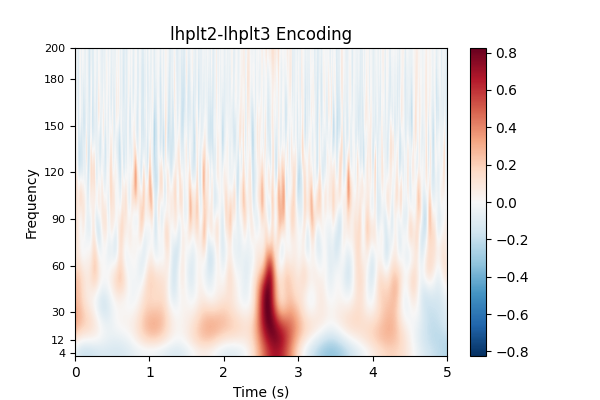

<IPython.core.display.Javascript object>


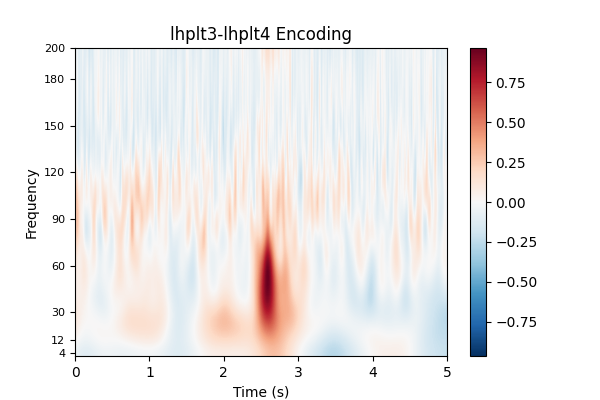

<IPython.core.display.Javascript object>


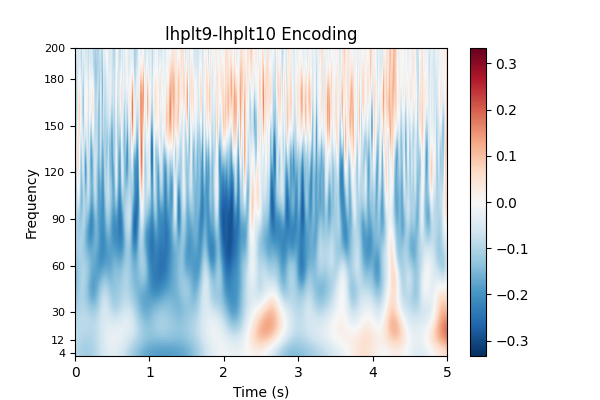

<IPython.core.display.Javascript object>


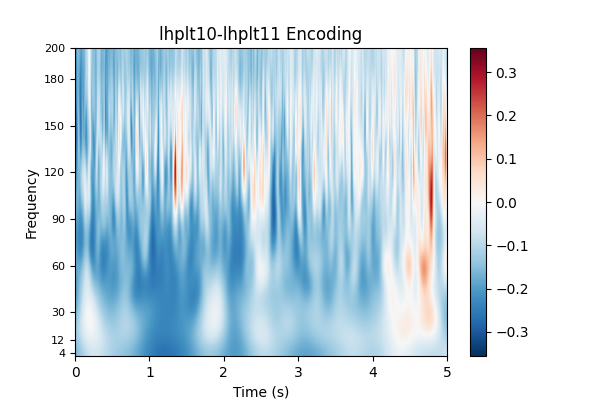

<IPython.core.display.Javascript object>


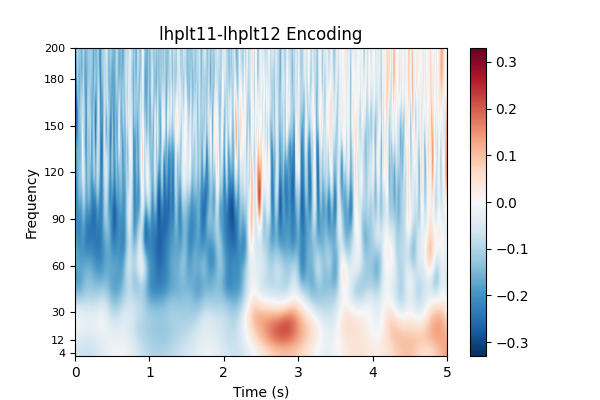

<IPython.core.display.Javascript object>


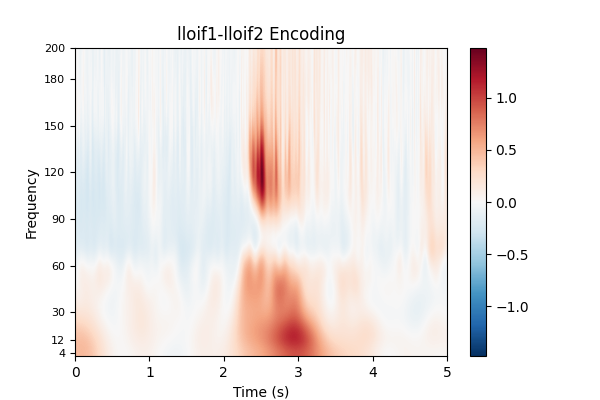

<IPython.core.display.Javascript object>


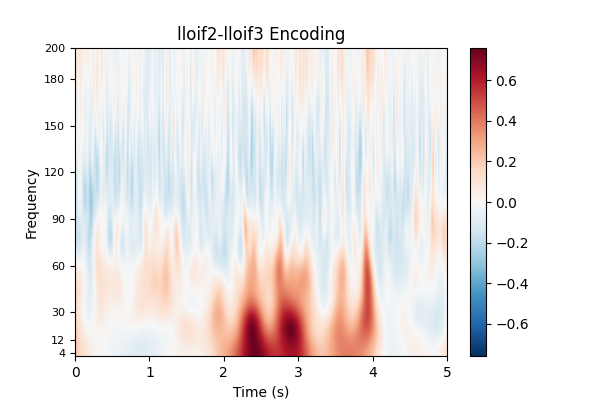

<IPython.core.display.Javascript object>


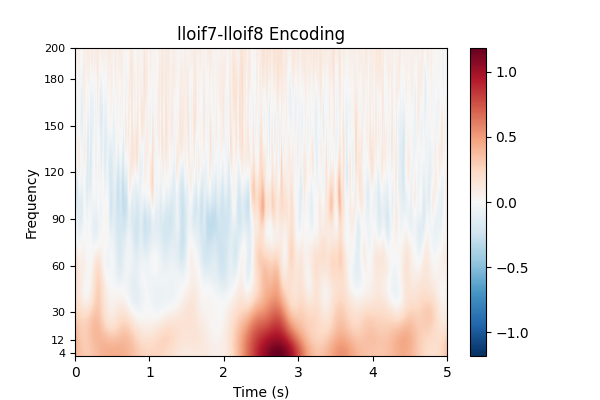

<IPython.core.display.Javascript object>


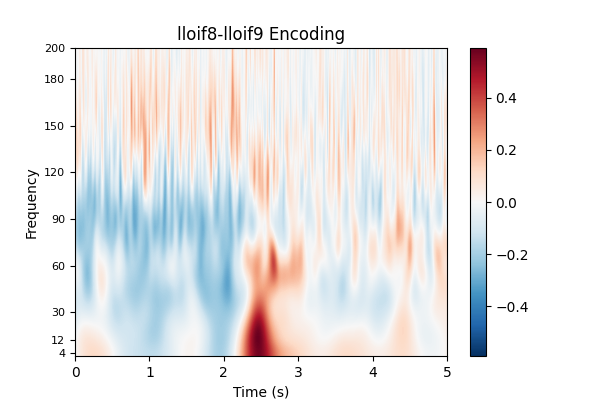

<IPython.core.display.Javascript object>


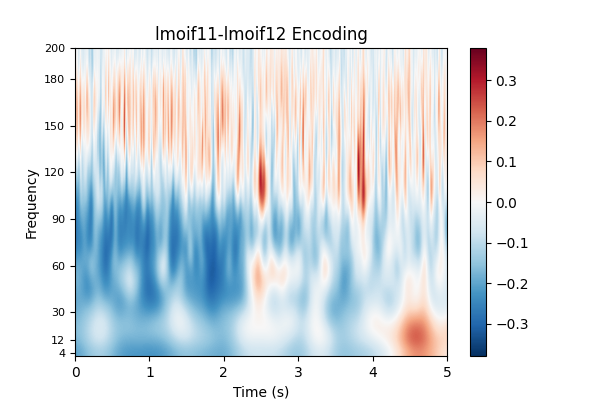

<IPython.core.display.Javascript object>


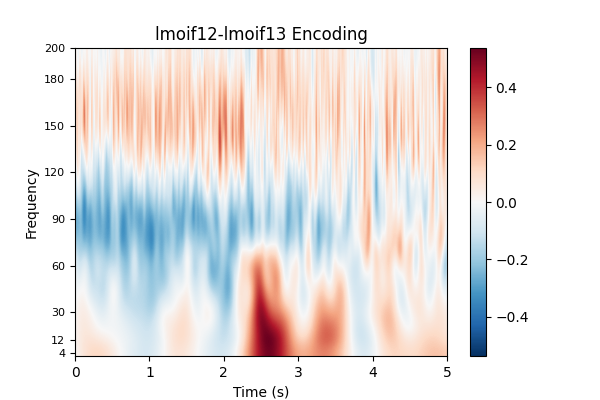

<IPython.core.display.Javascript object>


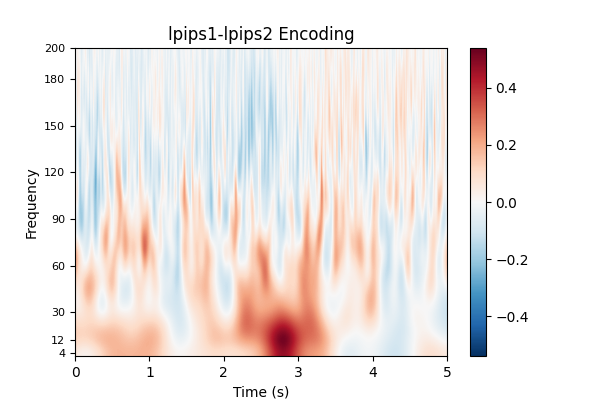

<IPython.core.display.Javascript object>


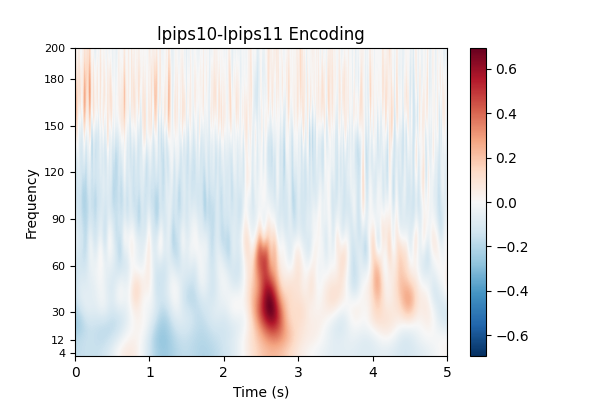

<IPython.core.display.Javascript object>


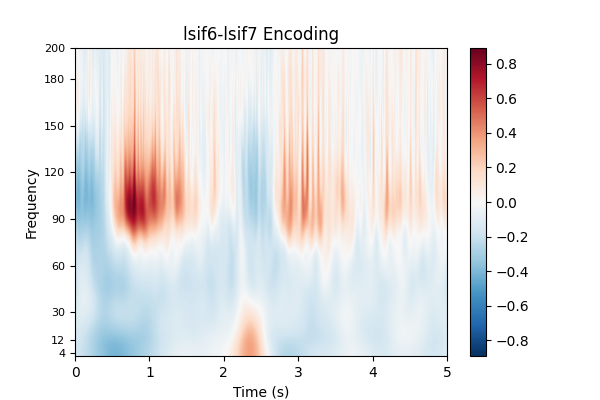

<IPython.core.display.Javascript object>


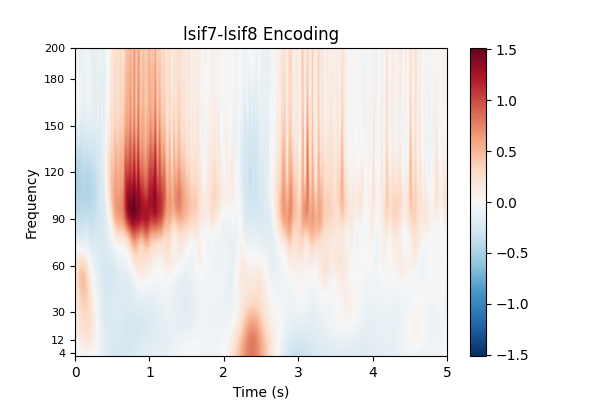

<IPython.core.display.Javascript object>


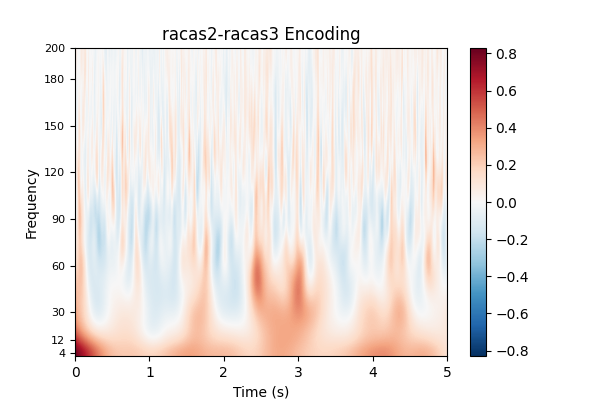

<IPython.core.display.Javascript object>


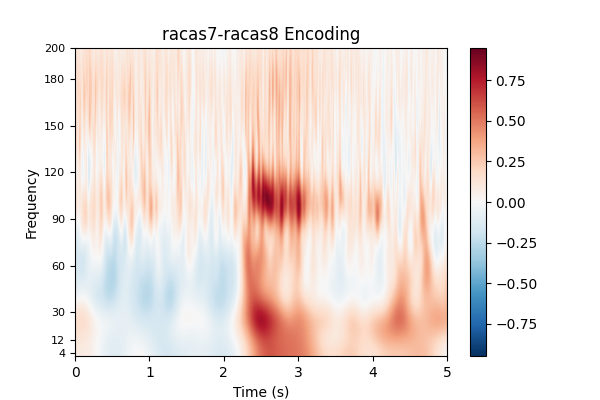

<IPython.core.display.Javascript object>


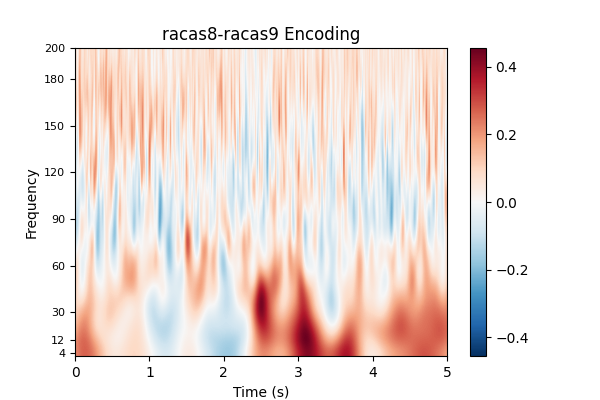

<IPython.core.display.Javascript object>


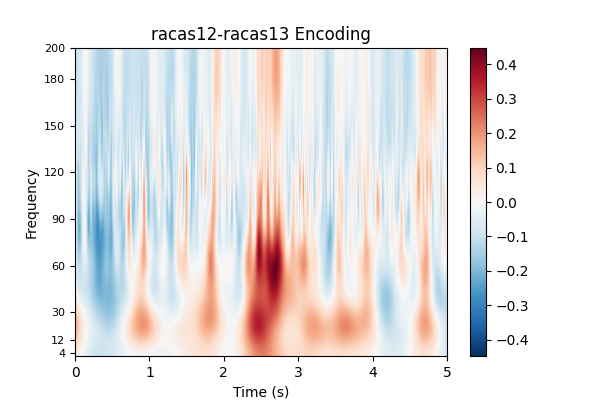

<IPython.core.display.Javascript object>


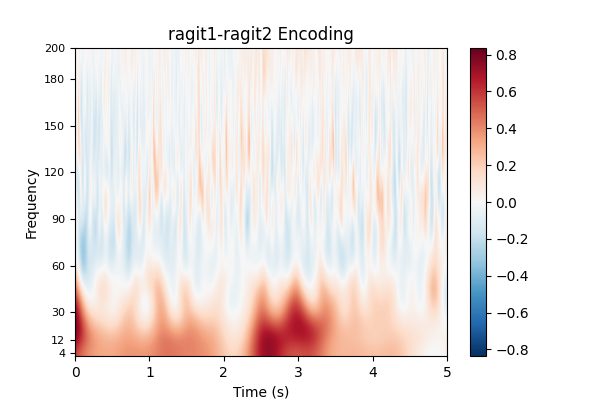

<IPython.core.display.Javascript object>


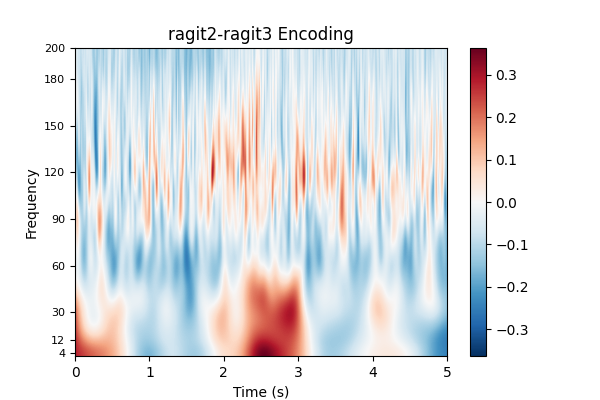

<IPython.core.display.Javascript object>


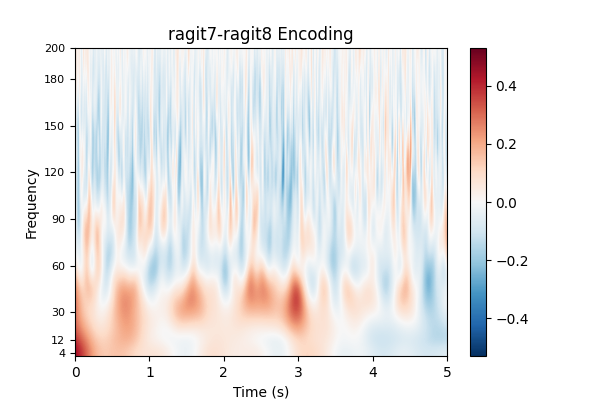

<IPython.core.display.Javascript object>


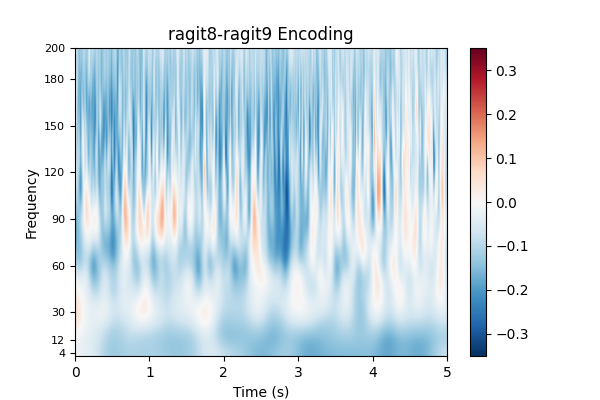

<IPython.core.display.Javascript object>


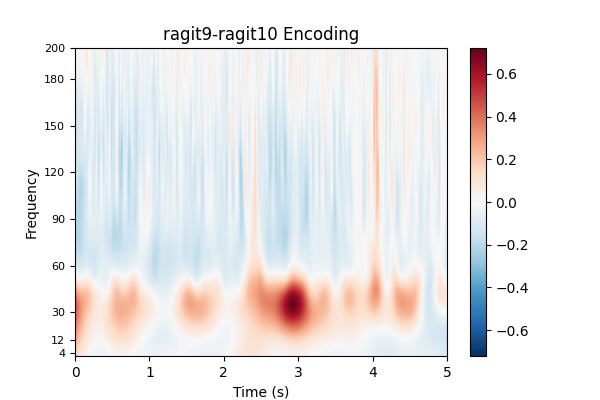

<IPython.core.display.Javascript object>


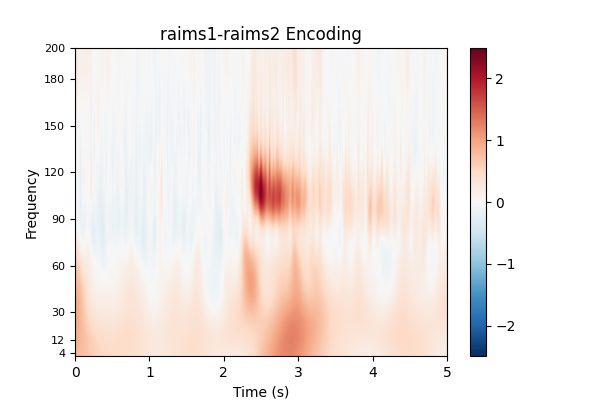

<IPython.core.display.Javascript object>


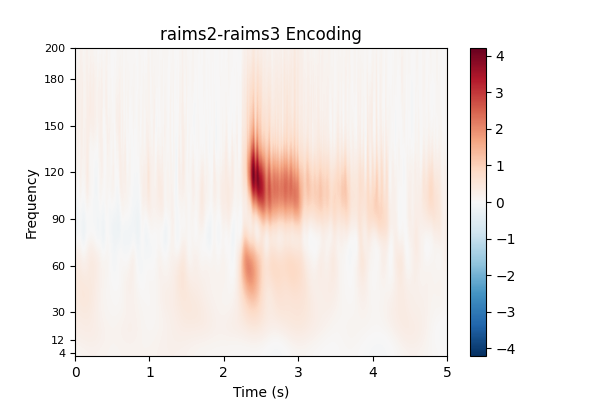

<IPython.core.display.Javascript object>


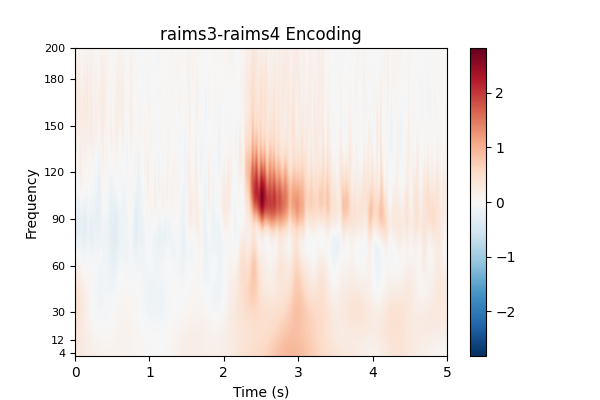

<IPython.core.display.Javascript object>


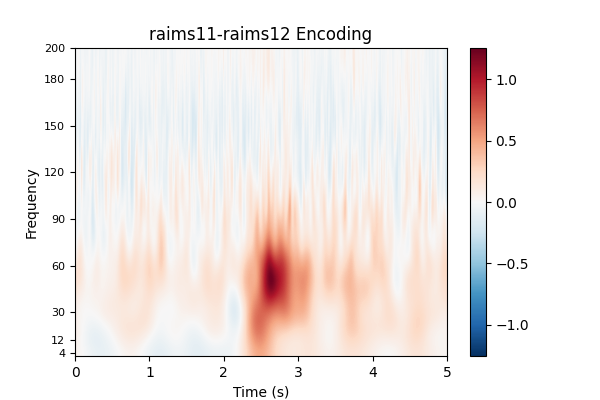

<IPython.core.display.Javascript object>


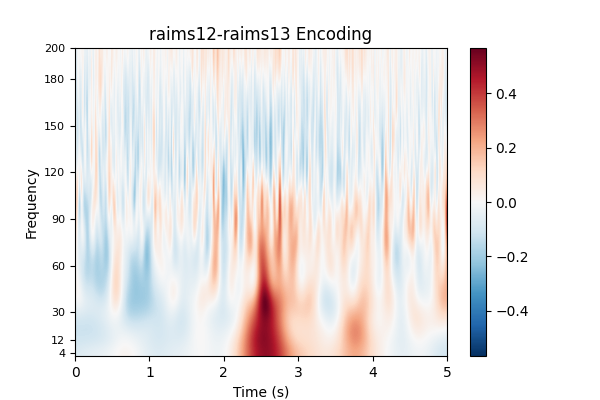

<IPython.core.display.Javascript object>


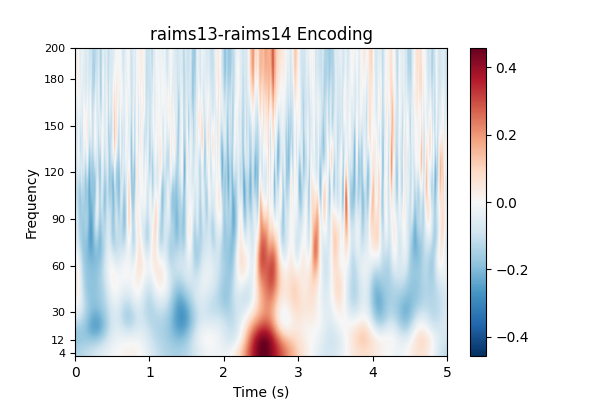

<IPython.core.display.Javascript object>


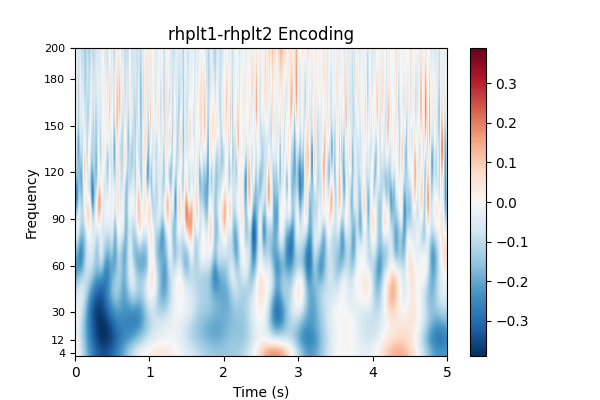

<IPython.core.display.Javascript object>


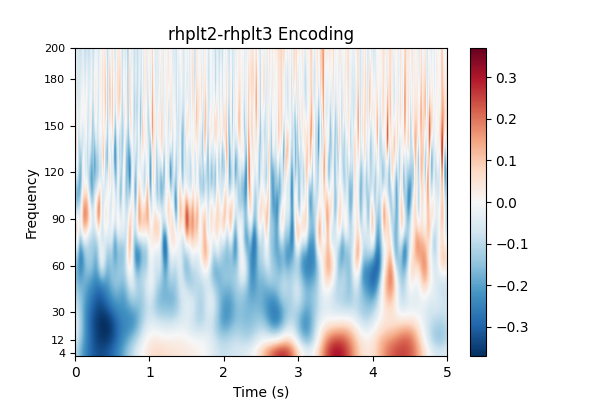

<IPython.core.display.Javascript object>


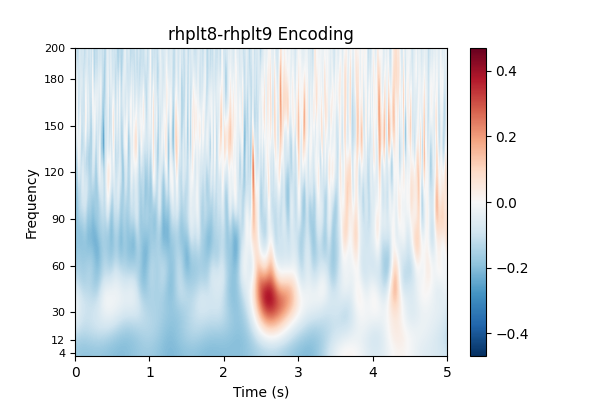

<IPython.core.display.Javascript object>


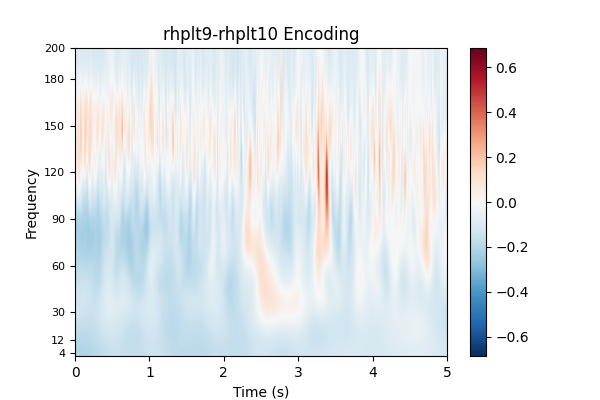

<IPython.core.display.Javascript object>


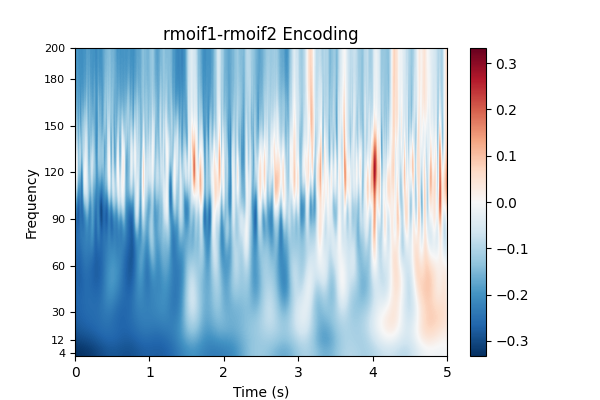

<IPython.core.display.Javascript object>


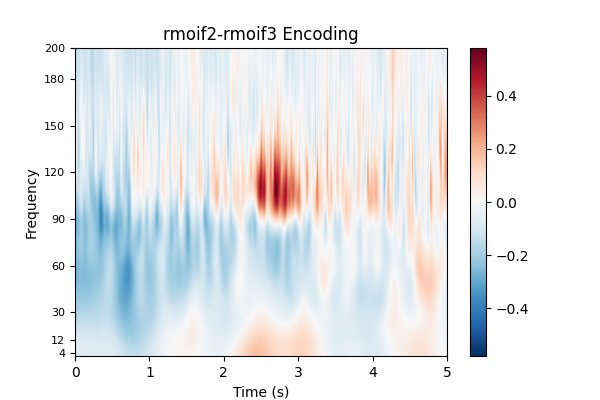

<IPython.core.display.Javascript object>


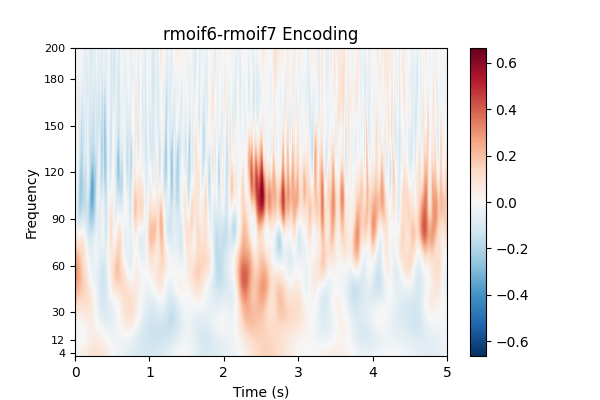

<IPython.core.display.Javascript object>


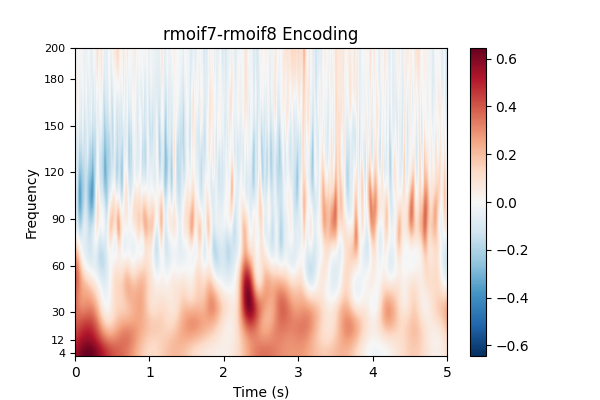

<IPython.core.display.Javascript object>


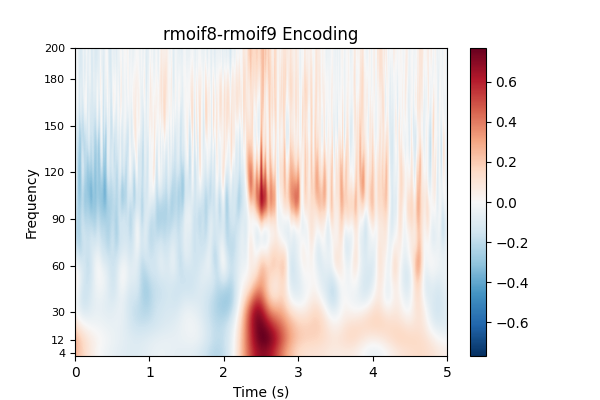

<IPython.core.display.Javascript object>


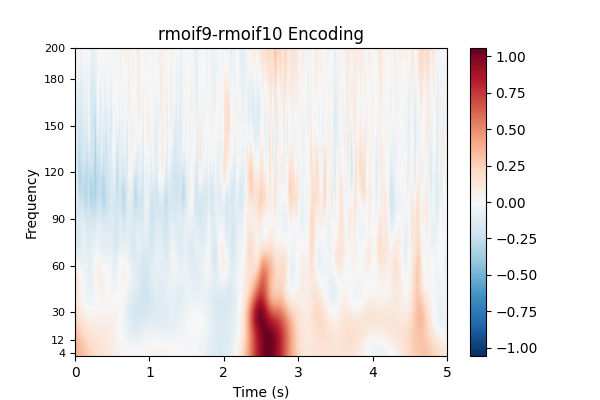

In [104]:
event = 'DecisionOnset'
yticks = [4, 12, 30, 60, 90, 120, 150, 180, 200]
good_ch = [x for x in power_epochs[event].ch_names if '-' in x]
save_path = tfr_dir

print(offset)


for ch in good_ch:
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    times = power_epochs[event].times
    plot_data = np.nanmean(np.nanmean(power_epochs[event].copy().pick_channels([ch]).data, axis=0), axis=0)

    im = ax.imshow(plot_data,
            extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation='Bicubic',
            aspect='auto', origin='lower', cmap='RdBu_r',vmin = -np.nanmax(np.abs(plot_data)), vmax = np.nanmax(np.abs(plot_data)))
    ax.set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency',title=f'{ch} Encoding')
    ax.yaxis.set_tick_params(labelsize=8)
    fig.colorbar(im, ax=ax)
    plt.savefig(f'{save_path}/{ch}_{date}_bp_ref.png', format='png', metadata=None,
    bbox_inches=None, pad_inches=0.1,
    facecolor='auto', edgecolor='auto',
    backend=None)
#     plt.close()
